In [1]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [2]:
import pandas as pd
import seaborn as sns

sns.set_theme(context='talk', 
              style='whitegrid', 
              palette='Set2',
              font_scale=1.4, 
              rc={'figure.figsize': (14, 6)})

import plotly.graph_objects as go
import plotly.io as pio
import plotly.express as px
import plotly
pio.templates.default = 'plotly_white+presentation'



import scipy.optimize
import scipy.constants as sc

hbarc = sc.hbar*sc.speed_of_light/sc.giga/sc.electron_volt / sc.femto

from scipy.interpolate import InterpolatedUnivariateSpline


import json
import os
import glob

import sys
sys.path.append('../src')
from luscher_lib import Luscher_zeta, Kcot_luscher

from tqdm import tqdm

# load data

In [3]:
df_conf = pd.read_csv('../data/CLS_conf_inf.csv')
df_conf['a2 [fm2]'] = df_conf['a [fm]'].apply(lambda x: x**2)
df_conf['a_inv [GeV]'] = (hbarc / df_conf['a [fm]']).round(3) # add lattice unit
df_conf

,Label,N_f,beta,kappa,size_L,size_T,bdy.cond.,a [fm],m_pi [MeV],L [fm],m_pi L,m_B [GeV],N_conf,N_tsrc,N_meas,N_LapH,a2 [fm2],a_inv [GeV]
0,N300,3,3.70,0.137000,48,128,open,0.0498,422,2.4,5.1,1.19,2047,12,24564,32,0.002480,3.962
1,N202,3,3.55,0.137000,48,128,open,0.0642,412,3.1,6.4,1.17,899,8,10788,68,0.004122,3.074
2,H200,3,3.55,0.137000,32,96,open,0.0642,419,2.1,4.4,1.19,2000,8,16000,20,0.004122,3.074
3,B450,3,3.46,0.136890,32,64,periodic,0.0762,417,2.4,5.2,1.18,1612,8,25762,32,0.005806,2.590
4,H101,3,3.40,0.136760,32,96,open,0.0865,417,2.8,5.9,1.16,2016,4,12096,48,0.007482,2.281
5,U103,3,3.40,0.136760,24,128,open,0.0865,414,2.1,4.4,1.18,5658,5,45264,20,0.007482,2.281
6,A653,3,3.34,0.136572,24,48,periodic,0.0992,424,2.4,5.1,1.16,5050,4,40400,32,0.009841,1.989
7,E5,2,5.30,0.136250,32,64,periodic,0.0658,436,2.1,4.7,1.29,2000,4,16000,30,0.004330,2.999
8,E1,2,5.30,0.135500,32,64,periodic,0.0658,978,2.1,10.4,2.03,168,8,2688,30,0.004330,2.999


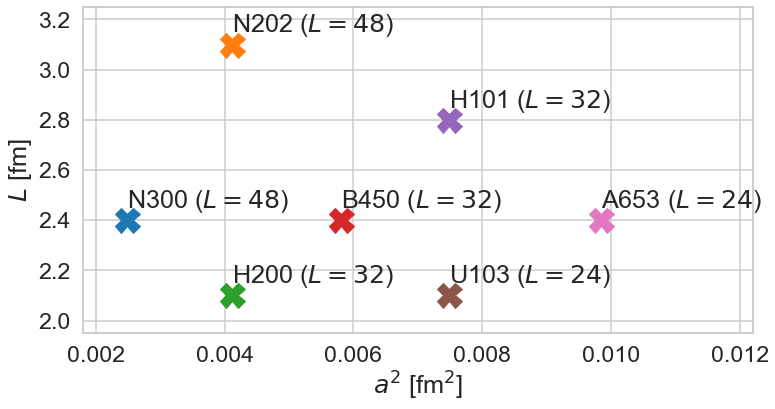

In [4]:
# for utility
lat_unit_dic = df_conf.set_index('Label')['a [fm]'].to_dict()
a_inv_dic = df_conf.set_index('Label')['a_inv [GeV]'].to_dict()
L_fm_dic = df_conf.set_index('Label')['L [fm]'].to_dict()
L_dic = df_conf.set_index('Label')['size_L'].to_dict()
pion_mass_dic = df_conf.set_index('Label')['m_pi [MeV]'].to_dict()
baryon_mass_dic = df_conf.set_index('Label')['m_B [GeV]'].to_dict()
label_list = list(df_conf['Label'])

with sns.color_palette('tab10'):
    fig, ax = plt.subplots(figsize=(12, 6))
    for label in label_list:
        if label in ['E5', 'E1']: continue
        a2 = lat_unit_dic.get(label)**2
        L_fm = L_fm_dic.get(label)
        ax.plot(a2, L_fm, 'X', ms=25)
        ax.text(a2, L_fm+0.05, fr'{label} ($L = {L_dic.get(label)}$)')
    ax.set(xlabel=r'$a^2$ [fm$^2$]', ylabel='$L$ [fm]', xlim=(0.0018, 0.0122), ylim=(1.95, 3.25))
#    fig.savefig('../figs/SU3_ensembles.png', bbox_inches='tight')

In [5]:
ls ../data/pcot_p2/

A653_P000_0_spin_zero.json  H101_P011_0_spin_zero.json
A653_P000_1_spin_zero.json  H101_P011_1_spin_zero.json
A653_P001_0_spin_zero.json  H101_P111_0_spin_zero.json
A653_P001_1_spin_zero.json  H101_P111_1_spin_zero.json
A653_P002_0_spin_zero.json  H200_P000_0_spin_zero.json
A653_P011_0_spin_zero.json  H200_P000_1_spin_zero.json
A653_P011_1_spin_zero.json  H200_P001_0_spin_zero.json
A653_P111_0_spin_zero.json  H200_P001_1_spin_zero.json
A653_P111_1_spin_zero.json  H200_P002_0_spin_zero.json
B450_P000_0_spin_zero.json  H200_P011_0_spin_zero.json
B450_P000_1_spin_zero.json  H200_P011_1_spin_zero.json
B450_P001_0_spin_zero.json  H200_P111_0_spin_zero.json
B450_P001_1_spin_zero.json  H200_P111_1_spin_zero.json
B450_P002_0_spin_zero.json  N202_P000_0_spin_zero.json
B450_P011_0_spin_zero.json  N202_P000_1_spin_zero.json
B450_P011_1_spin_zero.json  N202_P001_0_spin_zero.json
B450_P111_0_spin_zero.json  N202_P001_1_spin_zero.json
B450_P111_1_spin_zero.json  N202_P002_0_spin_zero.json
E1_P000_0_

In [6]:
ld_dic = {}
for fname in glob.glob('../data/pcot_p2/*.json'):
    with open(fname, 'r') as fin:
        tmp = json.load(fin)
        ld_dic[(tmp.get('label'), tmp.get('frame'), tmp.get('level'))] = tmp

# plot

In [7]:
xlim0 = (-0.8, 2.5)
ylim0 = (-0.9, 15.9)


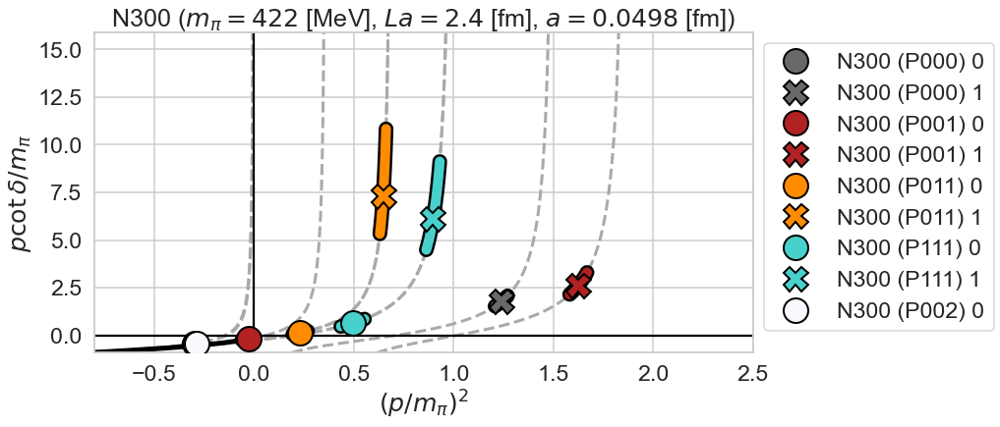

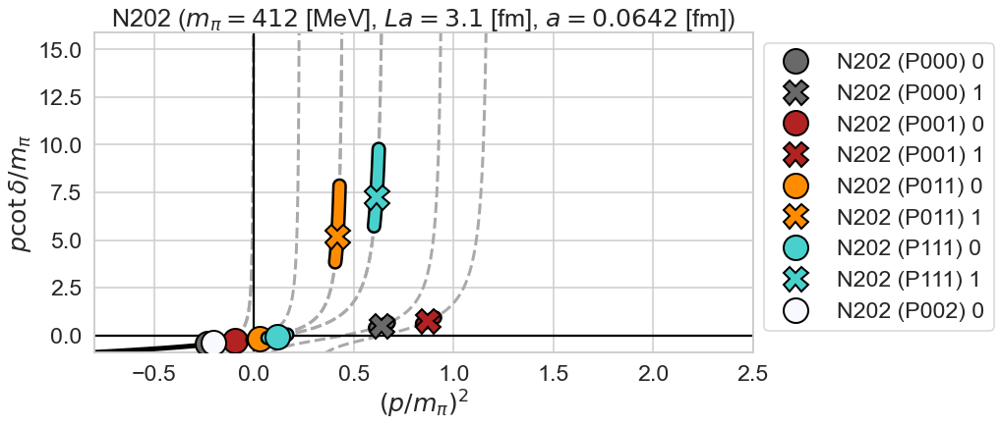

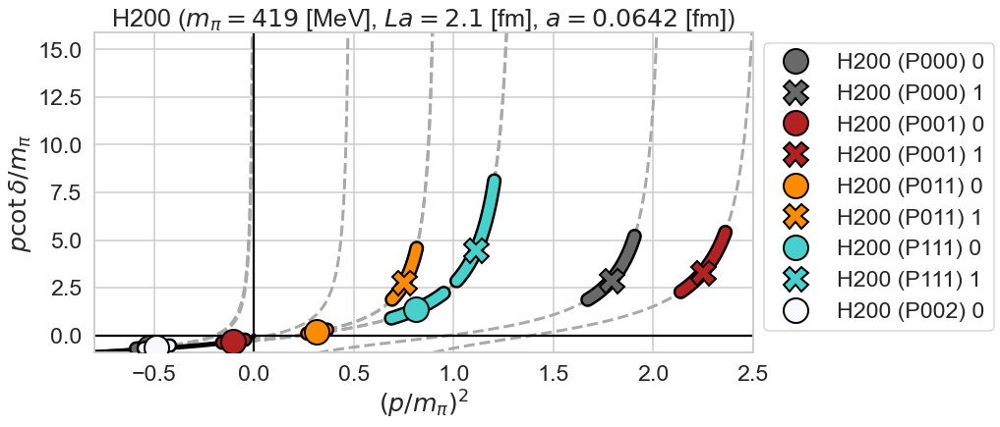

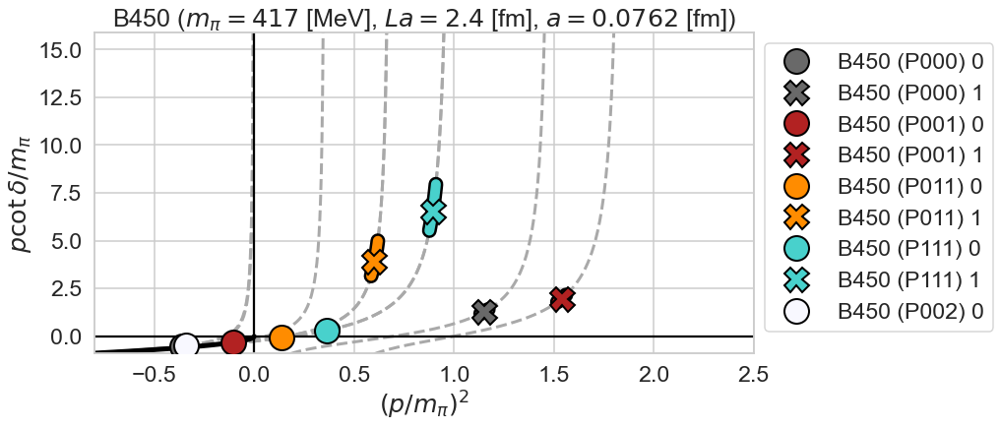

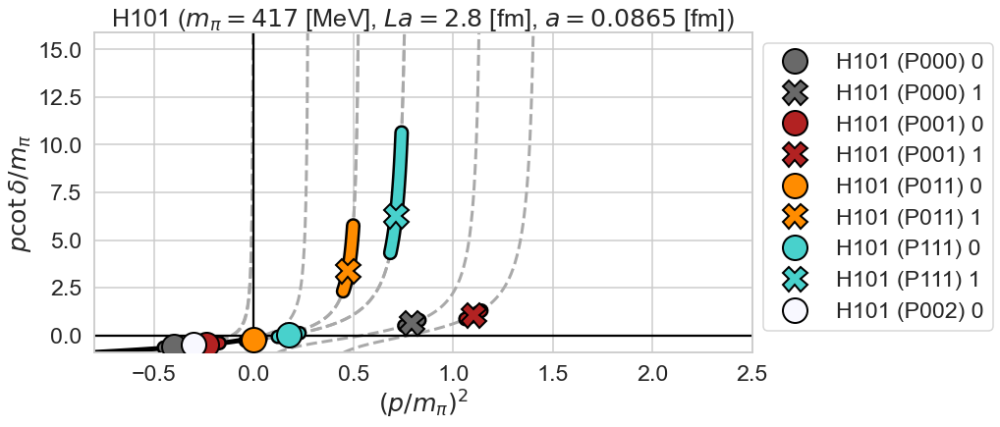

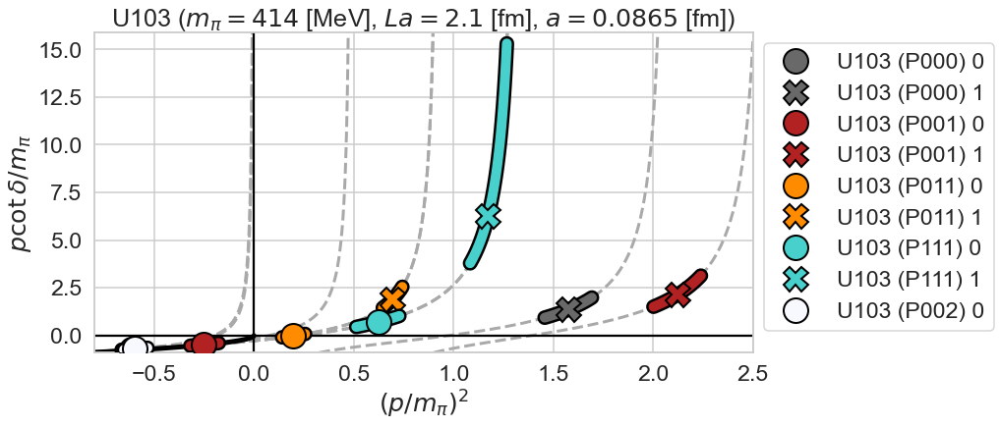

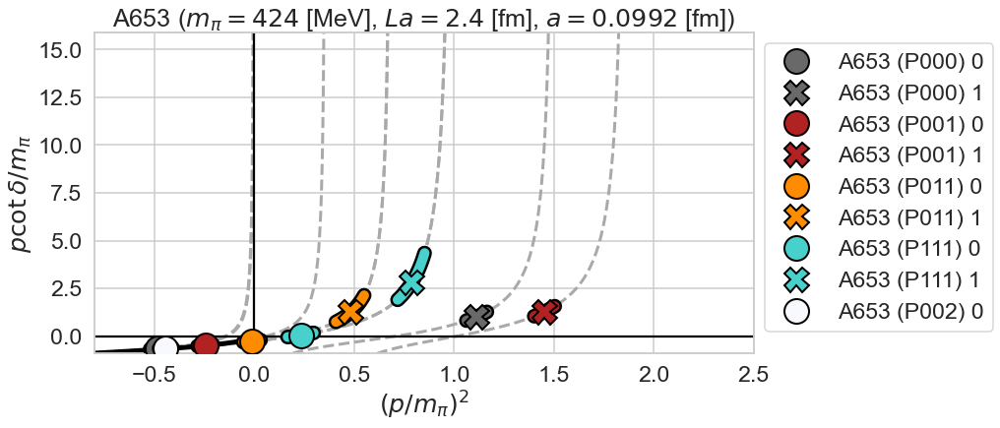

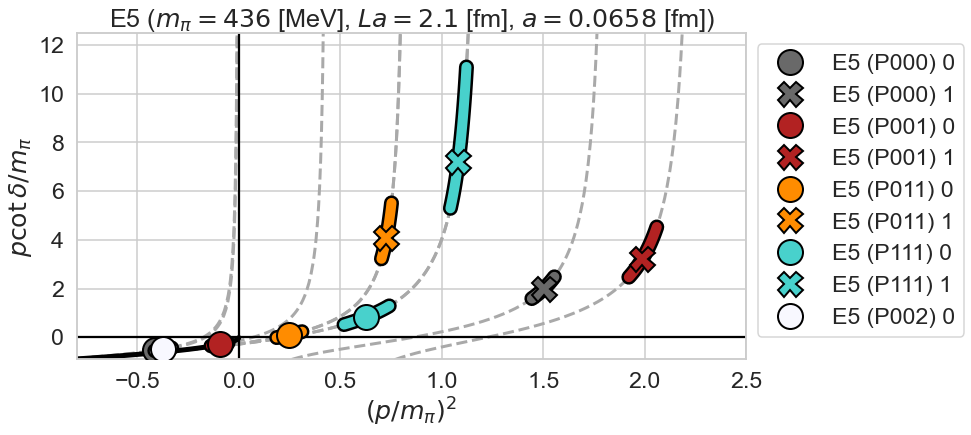

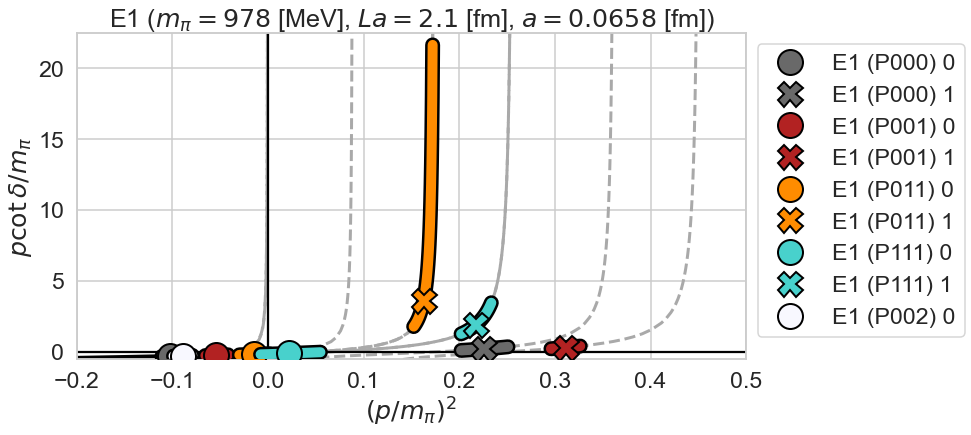

In [8]:
xlim, ylim = xlim0, ylim0

color_list = {'P000': 'dimgray', 'P001': 'firebrick', 'P011': 'darkorange', 'P111': 'mediumturquoise', 'P002': 'ghostwhite'}

for label in ['N300', 'N202', 'H200', 'B450', 'H101', 'U103', 'A653', 'E5', 'E1']:
    if label == 'E1':
        xlim, ylim = (-0.2, 0.5), (-0.5, 22.5)
    if label == 'E5':
        xlim, ylim = (-0.8, 2.5), (-0.9, 12.5)
        
    fig, ax = plt.subplots(figsize=(12, 6))

    for frame in ['P000', 'P001', 'P011', 'P111', 'P002']:
        c = color_list.get(frame)
        for level in [0, 1]:
            try:
                ld = ld_dic[(label, frame, level)]

                ax.plot(ld.get('k2mpi2s'), ld.get('kcot_mpis'), color='black', zorder=3, lw=15)
                ax.plot(ld.get('k2mpi2s'), ld.get('kcot_mpis'), color=c, zorder=3, lw=10)

                sym = {0: 'o', 1: 'X'}[level]
                ax.plot(ld.get('k2mpi2'), ld.get('kcot_mpi'), sym, ms=25, color=c, mec='black', mew=2, zorder=3, label=f'{label} ({frame}) {level}')
                ax.plot(ld.get('k2mpi2_ref'), ld.get('kcot_mpi_ref'), ls='--', lw=3, color='darkgray')


            except:
                pass
            
    xbs = np.concatenate([np.linspace(xlim0[0], -0.5e-1), np.linspace(-0.5e-1, -2e-4)])
    ax.plot(xbs, - np.sqrt(-xbs), color='black', ls='-', lw=5)

    ax.legend(loc='upper left', bbox_to_anchor=(1,1))
    ax.axhline(0, color='black')
    ax.axvline(0, color='black')
    ax.set(ylim=ylim, xlim=xlim, xlabel=r'$(p/m_\pi)^2$', ylabel=r'$p\cot\delta/m_\pi$',
          title=rf'{label} ($m_\pi = {pion_mass_dic.get(label)}$ [MeV], $La = {L_fm_dic.get(label)}$ [fm], $a = {lat_unit_dic.get(label)}$ [fm])')
    fig.savefig(f'../figs/pcot_vs_p2/{label}_pcot_vs_p2.png', bbox_inches='tight') # , transparent=True)

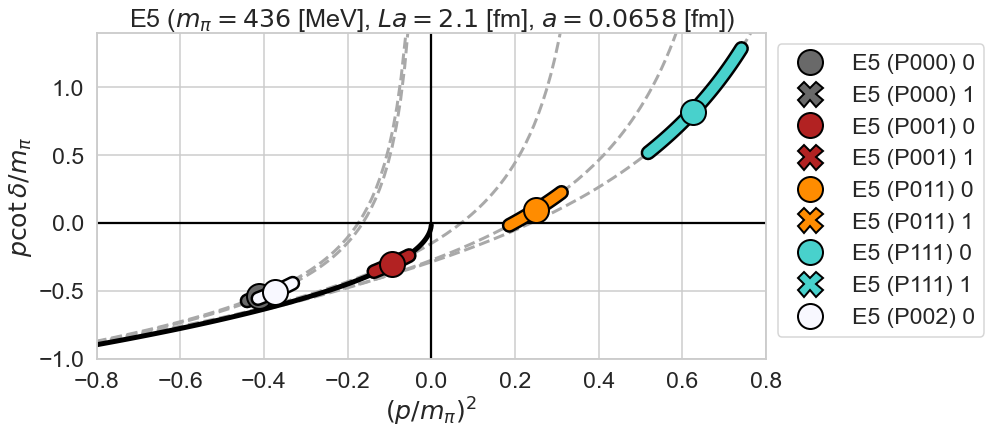

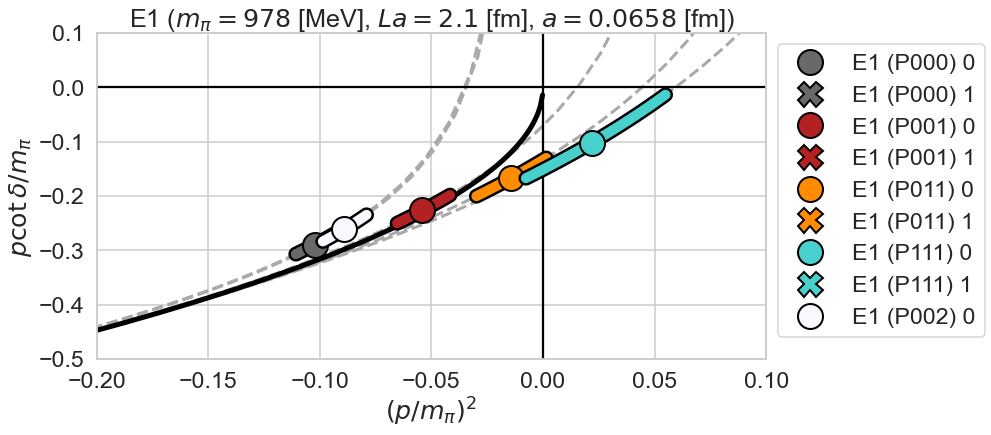

In [9]:
xlim, ylim = (-0.8, 0.4), (-0.9, 0.4)

color_list = {'P000': 'dimgray', 'P001': 'firebrick', 'P011': 'darkorange', 'P111': 'mediumturquoise', 'P002': 'ghostwhite'}

for label in ['N300', 'N202', 'H200', 'B450', 'H101', 'U103', 'A653', 'E5', 'E1']:
    if label == 'E1':
        xlim, ylim = (-0.2, 0.1), (-0.5, 0.1)
    elif label == 'E5':
        xlim, ylim = (-0.8, 0.8), (-1, 1.4)
    else:
        continue

    
    fig, ax = plt.subplots(figsize=(12,6))

    for frame in ['P000', 'P001', 'P011', 'P111', 'P002']:
        c = color_list.get(frame)
        for level in [0, 1]:
            try:
                ld = ld_dic[(label, frame, level)]

                ax.plot(ld.get('k2mpi2s'), ld.get('kcot_mpis'), color='black', zorder=3, lw=15)
                ax.plot(ld.get('k2mpi2s'), ld.get('kcot_mpis'), color=c, zorder=3, lw=10)

                sym = {0: 'o', 1: 'X'}[level]
                ax.plot(ld.get('k2mpi2'), ld.get('kcot_mpi'), sym, ms=25, color=c, mec='black', mew=2, zorder=3, label=f'{label} ({frame}) {level}')
                if level == 0:
                    ax.plot(ld.get('k2mpi2_ref'), ld.get('kcot_mpi_ref'), ls='--', lw=3, color='darkgray')


            except:
                pass
            
    xbs = np.concatenate([np.linspace(xlim0[0], -0.5e-1), np.linspace(-0.5e-1, -2e-4)])
    ax.plot(xbs, - np.sqrt(-xbs), color='black', ls='-', lw=5)

    ax.legend(loc='upper left', bbox_to_anchor=(1,1))
    ax.axhline(0, color='black')
    ax.axvline(0, color='black')
    ax.set(ylim=ylim, xlim=xlim, xlabel=r'$(p/m_\pi)^2$', ylabel=r'$p\cot\delta/m_\pi$',
          title=rf'{label} ($m_\pi = {pion_mass_dic.get(label)}$ [MeV], $La = {L_fm_dic.get(label)}$ [fm], $a = {lat_unit_dic.get(label)}$ [fm])')
    fig.savefig(f'../figs/pcot_vs_p2/{label}_pcot_vs_p2_neg.png', bbox_inches='tight') # , transparent=True)

In [10]:
def plotly_pcot_vs_p2(label, xlim, ylim):
    fig = go.Figure()

    color_list = {'P000': 'dimgray', 'P001': 'firebrick', 'P011': 'darkorange', 'P111': 'mediumturquoise', 'P002': 'ghostwhite'}


    xbs = np.concatenate([np.linspace(xlim[0], -0.5e-1), np.linspace(-0.5e-1,-2e-4)])


    fig.add_hline(y=0, line_width=3)
    fig.add_vline(x=0, line_width=3)

    fig.add_trace(
        go.Scatter(x=xbs, y=-np.sqrt(-xbs), mode='lines',
                  line=dict(color='black', width=5), name='bound state condition', showlegend=False)
    )


    for frame in ['P000', 'P001', 'P011', 'P111' ,'P002']:
        c = color_list.get(frame)
        for level in [0, 1]:
            try:
                ld = ld_dic[(label, frame, level)]

                sym={0:'circle', 1:'x', 2:'triangle-up'}[level]

                lbl = f'{label} ({frame}) n={level}'

                if (level == 1) and (frame in ['P011', 'P111']):
                    pass
                else:
                    fig.add_traces(
                        [
                            go.Scatter(x=ld.get('k2mpi2_ref'), y=ld.get('kcot_mpi_ref'), mode='lines',
                                        line=dict(dash='dash', color='gray', width=2), legendgroup=lbl, name='FV constraints', showlegend=False,
                                       hovertemplate='(%{x:.3f}, %{y:.3f})'
                                      )])
                fig.add_traces(
                    [
                        go.Scatter(x=ld.get('k2mpi2s'), y=ld.get('kcot_mpis'), mode='lines',
                                  line=dict(color='black', width=12), legendgroup=lbl, name='95CI',
                                  hovertemplate='(%{x:.3f}, %{y:.3f})', showlegend=False),
                        go.Scatter(x=ld.get('k2mpi2s'), y=ld.get('kcot_mpis'), mode='lines',
                                  line=dict(color=c, width=8), legendgroup=lbl, name='95CI',
                                  hovertemplate='(%{x:.3f}, %{y:.3f})', showlegend=False),
                        go.Scatter(x=[ld.get('k2mpi2')], y=[ld.get('kcot_mpi')], mode='markers',
                                   hovertemplate=lbl+'<br>(%{x:.3f}, %{y:.3f})', showlegend=True,
                                    marker=dict(color=c, size=25, symbol=sym,
                                               line=dict(width=2, color='black')), legendgroup=lbl, name=lbl)
                    ]
                )
            except:
                pass #print(label, frame, level)



    fig.update_layout(
        title=f'$\LARGE{{\mathrm{{{label}}} \ (m_\pi = {pion_mass_dic.get(label)} \ [\mathrm{{MeV}}], \ La = {L_fm_dic.get(label)} \ [\mathrm{{fm}}], a = {lat_unit_dic.get(label)} \ [\mathrm{{fm}}])}}$',
        xaxis_title='$\LARGE{(p/m_\pi)^2}$', 
                     yaxis_title='$\LARGE{p\cot\delta/m_\pi}$',
                     xaxis_range=xlim, yaxis_range=ylim,
                     font=dict(size=32))
    fig.write_html(f'../figs/pcot_vs_p2/{label}_pcot_vs_p2.html', include_mathjax='cdn', include_plotlyjs='cdn')
    return fig

In [11]:
label_list

['N300', 'N202', 'H200', 'B450', 'H101', 'U103', 'A653', 'E5', 'E1']

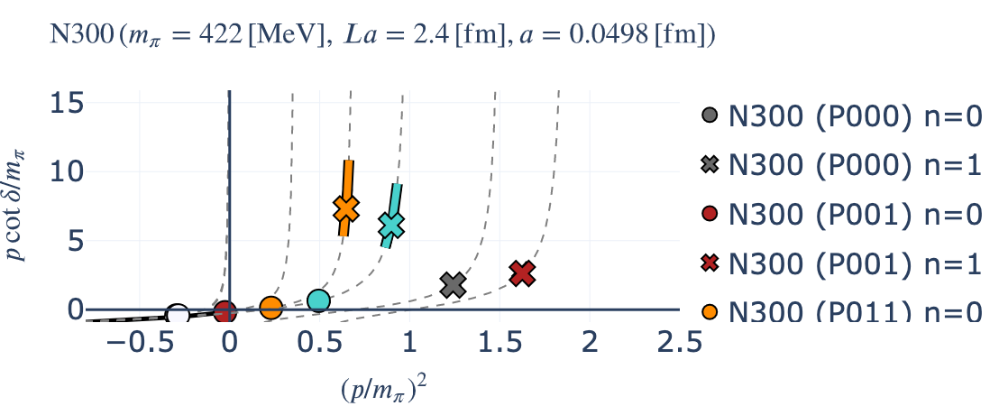

In [12]:
plotly_pcot_vs_p2('N300', xlim0, ylim0)

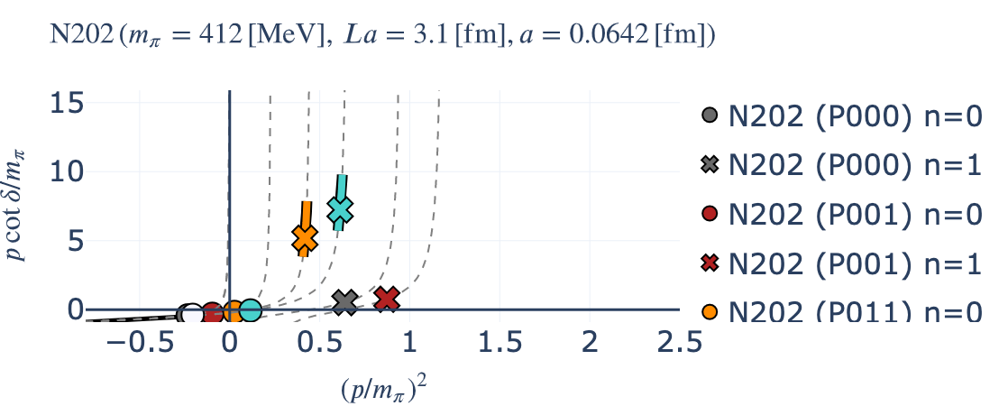

In [13]:
plotly_pcot_vs_p2('N202', xlim0, ylim0)

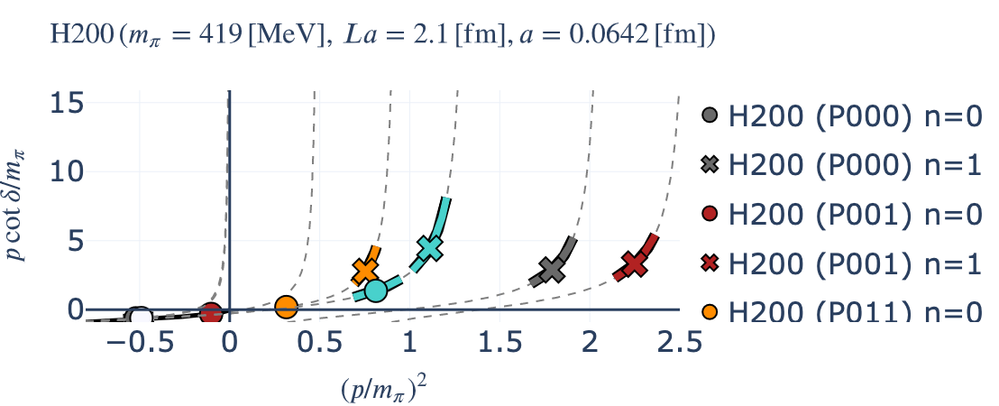

In [14]:
plotly_pcot_vs_p2('H200', xlim0, ylim0)

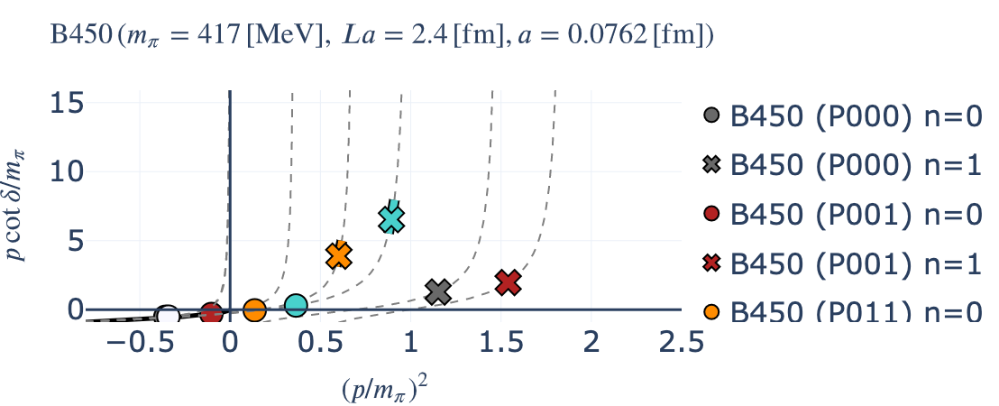

In [15]:
plotly_pcot_vs_p2('B450', xlim0, ylim0)

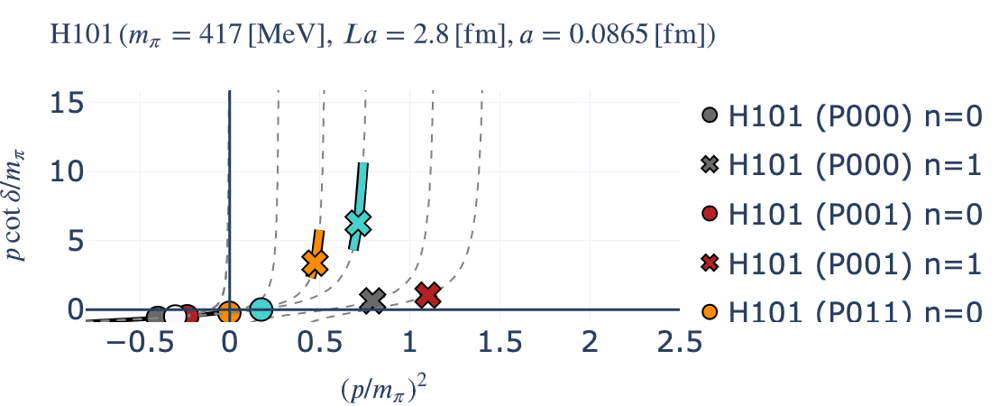

In [16]:
plotly_pcot_vs_p2('H101', xlim0, ylim0)

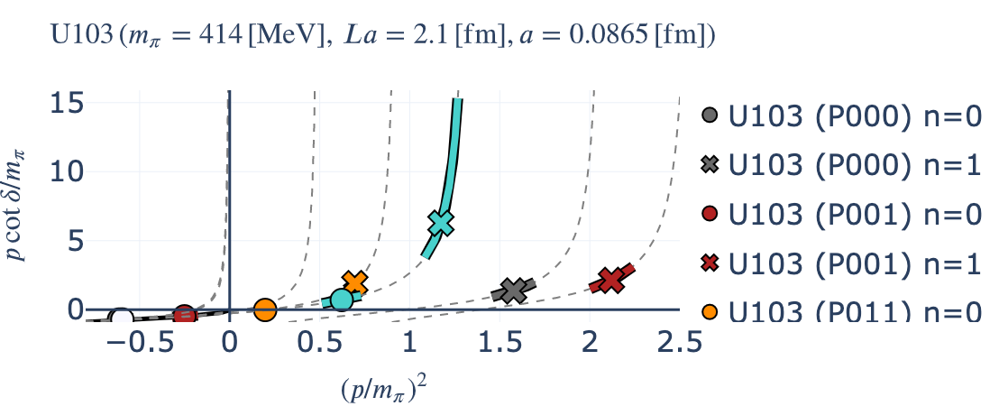

In [17]:
plotly_pcot_vs_p2('U103', xlim0, ylim0)

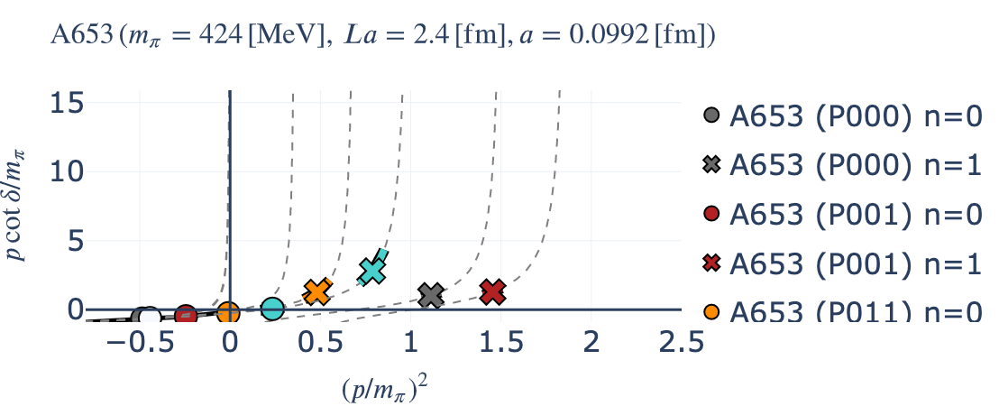

In [18]:
plotly_pcot_vs_p2('A653', xlim0, ylim0)

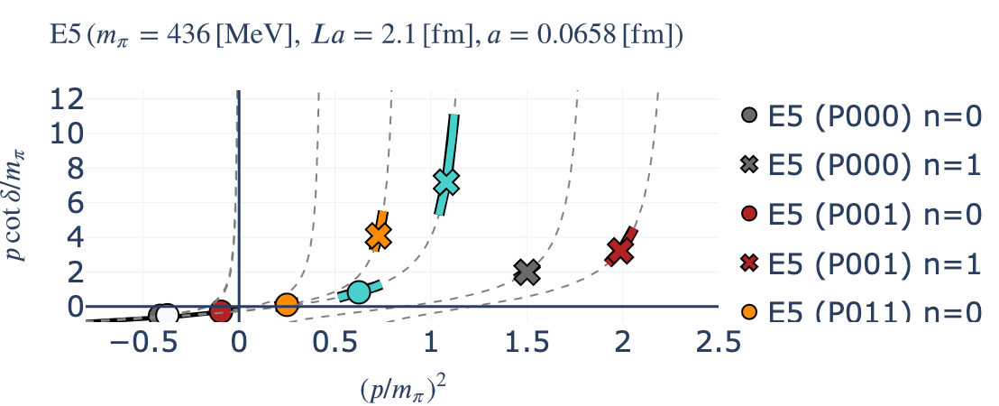

In [19]:
plotly_pcot_vs_p2('E5', (-0.8, 2.5), (-0.9, 12.5))

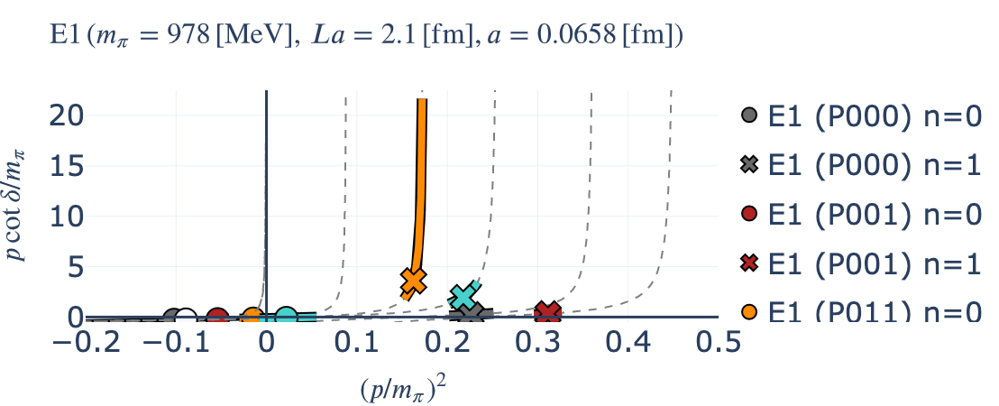

In [20]:
plotly_pcot_vs_p2('E1', (-0.2, 0.5), (-0.5, 22.5))

# all

In [21]:
color_list = sns.color_palette('tab10')

In [22]:
label_list

['N300', 'N202', 'H200', 'B450', 'H101', 'U103', 'A653', 'E5', 'E1']

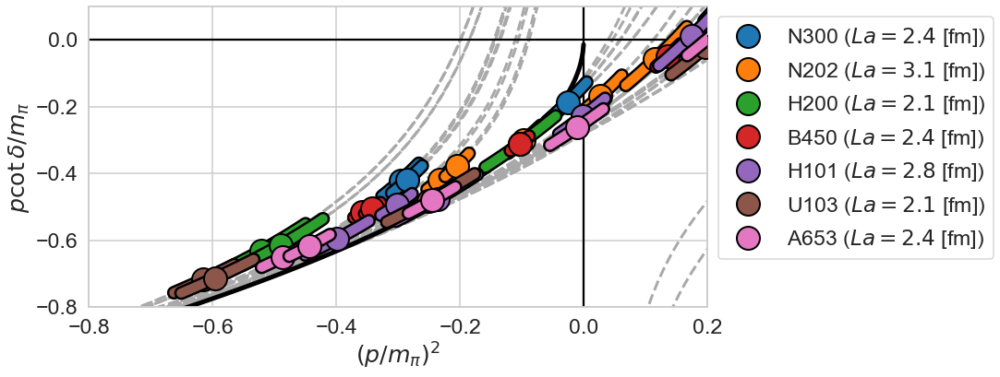

In [23]:
color_list = sns.color_palette('tab10')

xlim, ylim = (-0.8, 0.2), (-0.8, 0.1)

sym = 'o'
fig, ax = plt.subplots(figsize=(12, 6))

for ith, label in enumerate(label_list):
    if label in ['E5', 'E1']: continue
        
    c = color_list[ith]
    ax.plot([np.nan], [np.nan], sym, ms=25, color=c, mec='black', mew=2, zorder=3, label=fr'{label} ($La = {L_fm_dic.get(label)}$ [fm])')

    for level in [0, 1]:

        for frame in ['P000', 'P001', 'P011', 'P111', 'P002']:
            try:
                ld = ld_dic[(label, frame, level)]

                ax.plot(ld.get('k2mpi2s'), ld.get('kcot_mpis'), color='black', zorder=3, lw=15)
                ax.plot(ld.get('k2mpi2s'), ld.get('kcot_mpis'), color=c, zorder=3, lw=10)

                ax.plot(ld.get('k2mpi2'), ld.get('kcot_mpi'), sym, ms=25, color=c, mec='black', mew=2, zorder=3, label='')
                ax.plot(ld.get('k2mpi2_ref'), ld.get('kcot_mpi_ref'), ls='--', lw=3, color='darkgray')


            except:
                pass

xbs = np.concatenate([np.linspace(xlim0[0], -0.5e-1), np.linspace(-0.5e-1, -2e-4)])
ax.plot(xbs, - np.sqrt(-xbs), color='black', ls='-', lw=5)

ax.legend(loc='upper left', bbox_to_anchor=(1,1))
ax.axhline(0, color='black')
ax.axvline(0, color='black')
ax.set(ylim=ylim, xlim=xlim, xlabel=r'$(p/m_\pi)^2$', ylabel=r'$p\cot\delta/m_\pi$')
fig.savefig(f'../figs/pcot_vs_p2/pcot_vs_p2_all_neg.png', bbox_inches='tight')

# fixed lattice spacing

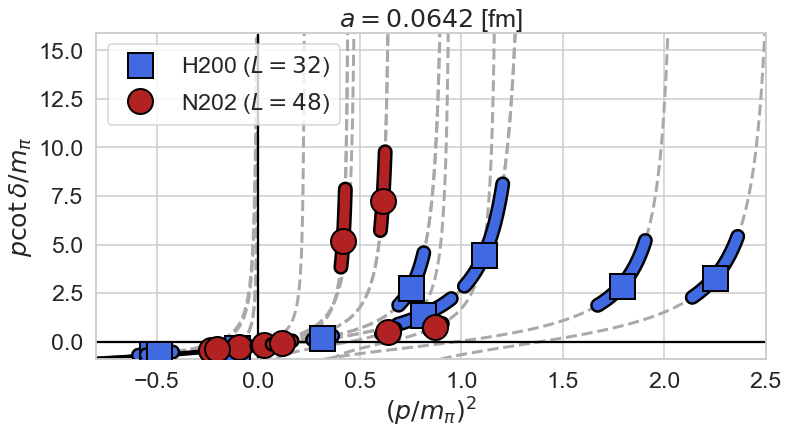

In [24]:
def comp_fixed_lattice_spacing(label_list, xlim, ylim, fig_suffix):
    fig, ax = plt.subplots(figsize=(12, 6))

    for label, c, sym in zip(label_list, ['royalblue', 'firebrick'], ['s', 'o']):
        ax.plot([np.nan], [np.nan], sym, ms=25, color=c, mec='black', mew=2, zorder=3, label=fr'{label} ($L = {L_dic.get(label)}$)')

        for level in [0, 1]:

            for frame in ['P000', 'P001', 'P011', 'P111', 'P002']:
                try:
                    ld = ld_dic[(label, frame, level)]

                    ax.plot(ld.get('k2mpi2s'), ld.get('kcot_mpis'), color='black', zorder=3, lw=15)
                    ax.plot(ld.get('k2mpi2s'), ld.get('kcot_mpis'), color=c, zorder=3, lw=10)

                    ax.plot(ld.get('k2mpi2'), ld.get('kcot_mpi'), sym, ms=25, color=c, mec='black', mew=2, zorder=3, label='')
                    ax.plot(ld.get('k2mpi2_ref'), ld.get('kcot_mpi_ref'), ls='--', lw=3, color='darkgray')


                except:
                    pass

    xbs = np.concatenate([np.linspace(xlim0[0], -0.5e-1), np.linspace(-0.5e-1, -2e-4)])
    ax.plot(xbs, - np.sqrt(-xbs), color='black', ls='-', lw=5)

    ax.legend(loc='upper left')
    ax.axhline(0, color='black')
    ax.axvline(0, color='black')
    ax.set(ylim=ylim, xlim=xlim, xlabel=r'$(p/m_\pi)^2$', ylabel=r'$p\cot\delta/m_\pi$',
          title=rf'$a = {lat_unit_dic.get(label)}$ [fm]')
    fig.savefig(f'../figs/pcot_vs_p2/pcot_vs_p2_{fig_suffix}.png', bbox_inches='tight')
        
comp_fixed_lattice_spacing(['H200', 'N202'], xlim=xlim0, ylim=ylim0, fig_suffix='lat_spacing_00642fm')

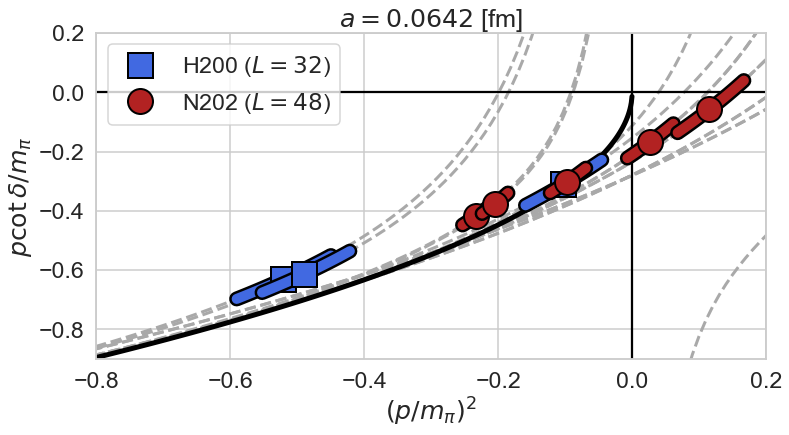

In [25]:
comp_fixed_lattice_spacing(['H200', 'N202'], xlim=(-0.8, 0.2), ylim=(-0.9, 0.2), fig_suffix='lat_spacing_00642fm_neg')

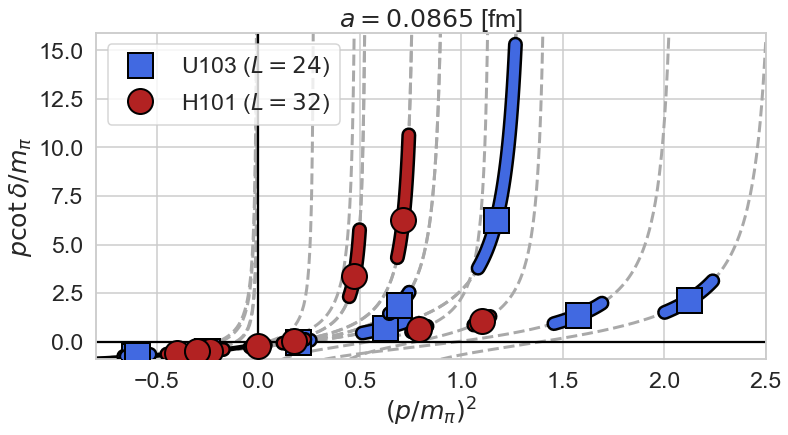

In [26]:
comp_fixed_lattice_spacing(['U103', 'H101'], xlim=xlim0, ylim=ylim0, fig_suffix='lat_spacing_00865fm')

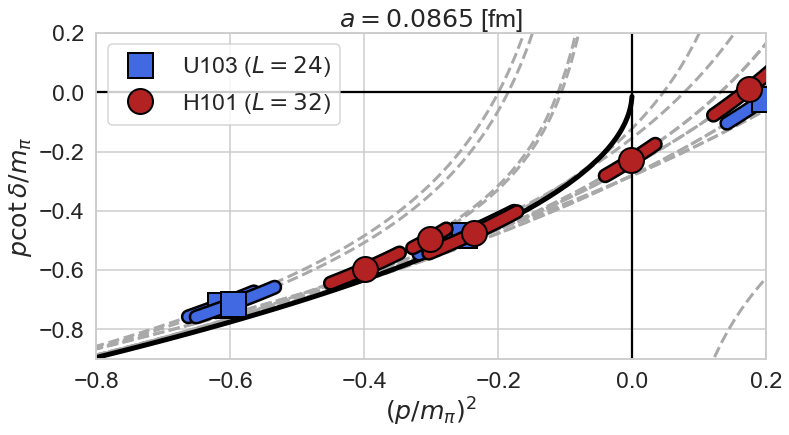

In [27]:
comp_fixed_lattice_spacing(['U103', 'H101'], xlim=(-0.8, 0.2), ylim=(-0.9, 0.2), fig_suffix='lat_spacing_00865fm_neg')

# fixed volume

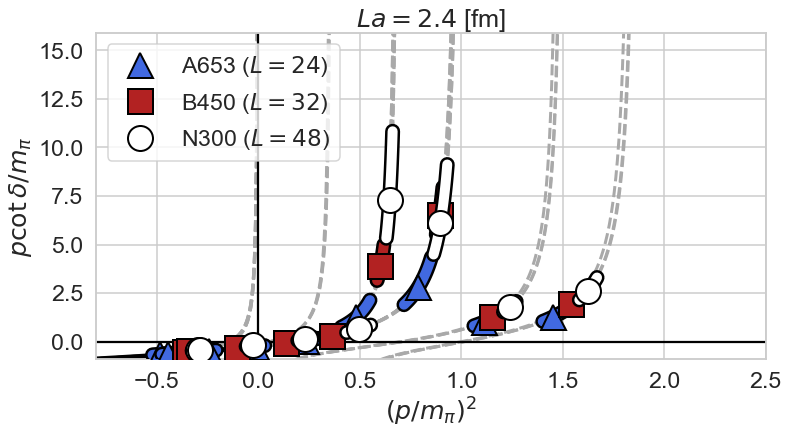

In [28]:
def comp_fixed_volume(label_list, xlim, ylim, fig_suffix):
    fig, ax = plt.subplots(figsize=(12, 6))

    for label, c, sym in zip(label_list, ['royalblue', 'firebrick', 'white'], ['^', 's', 'o']):
        ax.plot([np.nan], [np.nan], sym, ms=25, color=c, mec='black', mew=2, zorder=3, label=fr'{label} ($L = {L_dic.get(label)}$)')

        for level in [0, 1]:

            for frame in ['P000', 'P001', 'P011', 'P111', 'P002']:
                try:
                    ld = ld_dic[(label, frame, level)]

                    ax.plot(ld.get('k2mpi2s'), ld.get('kcot_mpis'), color='black', zorder=3, lw=15)
                    ax.plot(ld.get('k2mpi2s'), ld.get('kcot_mpis'), color=c, zorder=3, lw=10)

                    ax.plot(ld.get('k2mpi2'), ld.get('kcot_mpi'), sym, ms=25, color=c, mec='black', mew=2, zorder=3, label='')
                    ax.plot(ld.get('k2mpi2_ref'), ld.get('kcot_mpi_ref'), ls='--', lw=3, color='darkgray')


                except:
                    pass

    xbs = np.concatenate([np.linspace(xlim0[0], -0.5e-1), np.linspace(-0.5e-1, -2e-4)])
    ax.plot(xbs, - np.sqrt(-xbs), color='black', ls='-', lw=5)

    ax.legend(loc='upper left')
    ax.axhline(0, color='black')
    ax.axvline(0, color='black')
    ax.set(ylim=ylim, xlim=xlim, xlabel=r'$(p/m_\pi)^2$', ylabel=r'$p\cot\delta/m_\pi$',
          title=rf'$La = {L_fm_dic.get(label)}$ [fm]')
    fig.savefig(f'../figs/pcot_vs_p2/pcot_vs_p2_{fig_suffix}.png', bbox_inches='tight')
        
comp_fixed_volume(['A653', 'B450', 'N300'], xlim=xlim0, ylim=ylim0, fig_suffix='La_2_4fm')

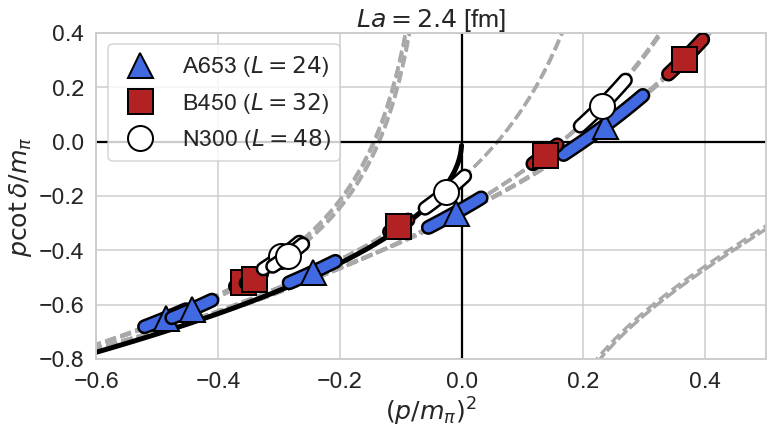

In [29]:
comp_fixed_volume(['A653', 'B450', 'N300'], xlim=(-0.6, 0.5), ylim=(-0.8, 0.4), fig_suffix='La_2_4fm_neg')

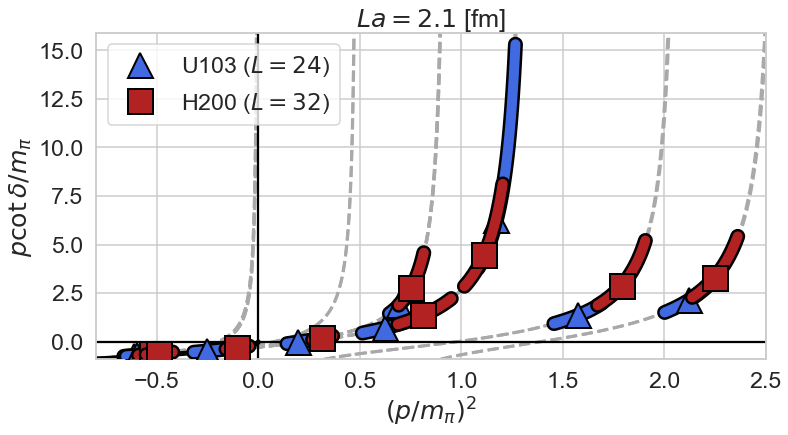

In [30]:
comp_fixed_volume(['U103', 'H200'], xlim=xlim0, ylim=ylim0, fig_suffix='La_2_2fm')

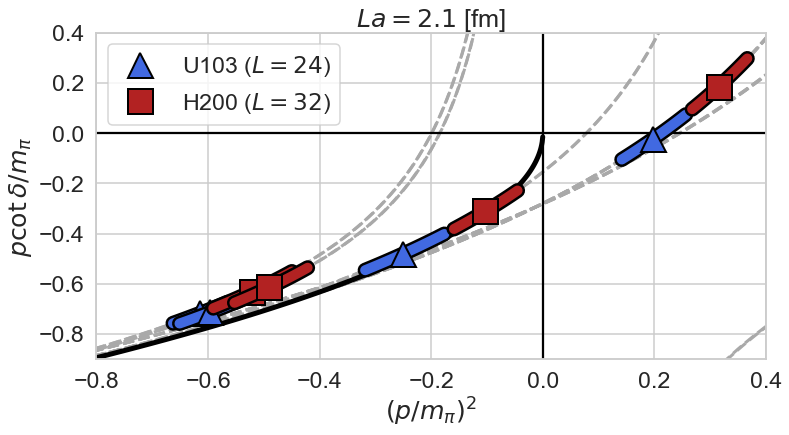

In [31]:
comp_fixed_volume(['U103', 'H200'], xlim=(-0.8, 0.4), ylim=(-0.9, 0.4), fig_suffix='La_2_2fm_neg')

# p-square vs binding energy

In [32]:
# approx. values
m_pi = 420 # MeV
m_B = 1200 # MeV

In [33]:
ls ../figs

BE_summary_Nf3.png     SU3_ensembles.png      hal_pot_finite_volume/
BE_vs_p_square.png     energy_levels/         pcot_vs_p2/
ERE/                   first_excited_state/


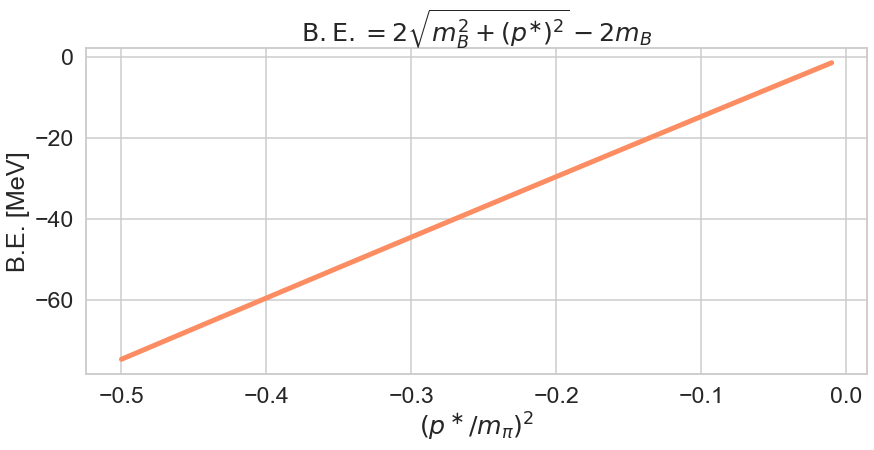

In [34]:
fig, ax = plt.subplots()

p_mpi_2 = np.linspace(-0.5, -0.01)
BE = 2 * np.sqrt(m_B**2 + p_mpi_2 * m_pi**2) - 2 * m_B

ax.plot(p_mpi_2, BE, lw=5, color='C1')

ax.set(ylabel='B.E. [MeV]', xlabel=r'$(p^\ast/m_\pi)^2$',
      title=r'$\mathrm{B.E.} = 2\sqrt{m_B^2 + (p^{\ast})^2} - 2 m_B$')

fig.savefig('BE_vs_p_square.png', bbox_inches='tight')

# ERE fitting

In [35]:
class ERE_fitting(object):
    def __init__(self, label, xlim, ylim, drop_list=[]):
        """
        label : ex. 'N300'
        xlim : (-xmin, xmax)
        ylim : (-ymin, ymax)
        """
        self.label = label
        self.xlim = xlim
        self.ylim = ylim
        
        self.drop_list = drop_list
    
    
    def check_ERE_intersection(self, ere_prm):
        """
        ere_prm : [1/a0, reff] in pion mass unit
        """
        ere = lambda k2: ere_prm[0] + 0.5*ere_prm[1]*k2

        color_list = {'P000': 'dimgray', 'P001': 'firebrick', 'P011': 'darkorange', 'P111': 'mediumturquoise', 'P002': 'ghostwhite'}

        xbs = np.concatenate([np.linspace(self.xlim[0], -0.5e-1), np.linspace(-0.5e-1,-2e-4)])

        fig = go.Figure()

        fig.add_hline(y=0, line_width=3)
        fig.add_vline(x=0, line_width=3)

        fig.add_trace(
            go.Scatter(x=xbs, y=-np.sqrt(-xbs), mode='lines',
                      line=dict(color='black', width=5), name='bound state condition', showlegend=False)
        )

        chisq = 0

        for frame in ['P000', 'P001', 'P011', 'P111' ,'P002']:
            c = color_list.get(frame)
            level = 0
            if (self.label, frame, level) in self.drop_list: continue
            try:
                ld = ld_dic[(self.label, frame, level)]

                sym={0:'circle', 1:'x', 2:'triangle-up'}[level]

                lbl = f'{label} ({frame}) n={level}'

                xs, ys = np.array(ld.get('k2mpi2_ref')), np.array(ld.get('kcot_mpi_ref'))
                ymsk = (ys > ylim[0]) & (ys < ylim[1])
                ll = InterpolatedUnivariateSpline(xs[ymsk], ys[ymsk])

                intersect = lambda k2: ere(k2) - ll(k2)
                sol = scipy.optimize.root(intersect, ld.get('k2mpi2'))

                fig.add_traces(
                    [
                        go.Scatter(x=ld.get('k2mpi2_ref'), y=ld.get('kcot_mpi_ref'), mode='lines',
                                        line=dict(dash='dash', color='gray', width=2), legendgroup=lbl, name='FV constraints', showlegend=False,
                                       hovertemplate='(%{x:.3f}, %{y:.3f})'),
                        go.Scatter(x=ld.get('k2mpi2s'), y=ld.get('kcot_mpis'), mode='lines',
                                  line=dict(color='black', width=12), legendgroup=lbl, name='95CI',
                                  hovertemplate='(%{x:.3f}, %{y:.3f})', showlegend=False),
                        go.Scatter(x=ld.get('k2mpi2s')[2:-2], y=ld.get('kcot_mpis')[2:-2], mode='lines',
                                  line=dict(color=c, width=8), legendgroup=lbl, name='95CI',
                                  hovertemplate='(%{x:.3f}, %{y:.3f})', showlegend=False),
                        go.Scatter(x=[ld.get('k2mpi2')], y=[ld.get('kcot_mpi')], mode='markers',
                                   hovertemplate=lbl+'<br>(%{x:.3f}, %{y:.3f})', showlegend=True,
                                    marker=dict(color=c, size=25, symbol=sym,
                                               line=dict(width=2, color='black')), legendgroup=lbl, name=lbl)
                    ]
                )
                if sol.success:
                    assert len(sol.x) == 1
                    if sol.x[0] < ld.get('k2mpi2'):
                        chisq += (sol.x[0] - ld.get('k2mpi2'))**2/(ld.get('k2mpi2') - np.min(ld.get('k2mpi2s')))**2
                    else:
                        chisq += (sol.x[0] - ld.get('k2mpi2'))**2/(np.max(ld.get('k2mpi2s')) - ld.get('k2mpi2'))**2

                    fig.add_trace(go.Scatter(x=sol.x, y=ere(sol.x), mode='markers', 
                                             marker=dict(color='royalblue', size=25, symbol='x',
                                                        line=dict(width=3, color='white')), showlegend=False, legendgroup=lbl, name='intersect'))
                else:
                    chisq = np.nan
            except:
                pass

        xls = np.linspace(self.xlim[0], self.xlim[1])
        fig.add_trace(
            go.Scatter(x=xls, y=ere(xls), mode='lines', line=dict(color='royalblue', width=5), name=f'ERE chi square = {chisq:.2f}')
        )

        fig.update_layout(
            title=f'$\LARGE{{\mathrm{{{label}}} \ (m_\pi = {pion_mass_dic.get(label)} \ [\mathrm{{MeV}}], \ La = {L_fm_dic.get(label)} \ [\mathrm{{fm}}], a = {lat_unit_dic.get(label)} \ [\mathrm{{fm}}])}}$',
            xaxis_title='$\LARGE{(p/m_\pi)^2}$', 
                         yaxis_title='$\LARGE{p\cot\delta/m_\pi}$',
                         xaxis_range=self.xlim, yaxis_range=self.ylim,
                         font=dict(size=32))
        return fig
    
    def ERE_fit_and_plot_params(self, a0inv_lim, reff_lim, mesh_num=100):
        a0invs = np.linspace(a0inv_lim[0], a0inv_lim[1], mesh_num)
        reffs = np.linspace(reff_lim[0], reff_lim[1], mesh_num)
        
        chisq_ere = np.array([[self._calc_ERE_chisq([a0inv, reff]), a0inv, reff] for a0inv in a0invs for reff in reffs])
        
        
        fig, ax = plt.subplots()

        chisq_min, a0inv0, reff0 = chisq_ere[np.nanargmin(chisq_ere[:,0]),:]
        ax.plot(a0inv0, reff0, 'X', color='blue', mew=2, mec='white', ms=35,
               label=f'({a0inv0:.2f}, {reff0:.2f})')

        zz = np.copy(chisq_ere[:,:].reshape(mesh_num,mesh_num,3))
        mask = zz[:,:,0] > chisq_min + 2.3 # for 2 parameters
        zz[:,:,0][mask] = np.nan

        cb = ax.contourf(zz[:,:,1], zz[:,:,2], zz[:,:,0]-chisq_min, np.linspace(0, 0+2.3,100),
                        cmap=cm.inferno)
        cb.set_clim(0,2.3)
        fig.colorbar(cb, ticks=[0,0.5,1.0,1.5,2.0])

        self.k2ast_av = self.EREprm_to_k2ast(a0inv0, reff0)
        mask2 = chisq_ere[:,0] <= chisq_min + 2.3
        k2ast_bs = self.EREprm_to_k2ast(chisq_ere[mask2,1],chisq_ere[mask2,2])
        self.k2ast_lower, self.k2ast_upper = np.min(k2ast_bs), np.max(k2ast_bs)
        
        self.BE_av = self.k2ast_to_BE(self.k2ast_av)
        self.BE_lower = self.k2ast_to_BE(self.k2ast_upper)
        self.BE_upper = self.k2ast_to_BE(self.k2ast_lower)
        

        ax.set_title(rf'{label} ERE parameter $\chi^2 - \chi^2_\mathrm{{min}}(={chisq_min:.2f})$'
            + '\n' + rf'$\mathrm{{B.E.}} = {self.BE_av:.2f}(_{{{self.BE_lower-self.BE_av:+.2f}}}^{{{self.BE_upper-self.BE_av:+.2f}}})$ [MeV]')
        ax.set_xlabel(r'$(a_0m_\pi)^{-1}$')
        ax.set_ylabel(r'$r_\mathrm{eff}m_\pi$')
        leg = ax.legend(frameon=True)
        leg.get_frame().set_edgecolor('black')
        leg.get_frame().set_linewidth(2.0)
        
        fig.savefig(f'../figs/ERE/{self.label}_ERE_parameter.png', bbox_inches='tight')
        
        
        self.chisq_ere = chisq_ere
        
        return self.BE_av, self.BE_lower, self.BE_upper
        
        
    def plot_k2_vs_kcot_with_ERE(self, xlim, ylim, suffix=''):
        ere_k2s = np.linspace(xlim[0], xlim[1])
        mask = self.chisq_ere[:,0] <= np.nanmin(self.chisq_ere[:,0]) + 2.3
        ere_upper = []
        ere_lower = []
        allowed_a0invs = self.chisq_ere[mask,1]
        allowed_reffs = self.chisq_ere[mask,2]
        ere_t = lambda p0, p1, k2: p0 + 0.5*p1*k2

        for k2 in ere_k2s:
            ere_upper.append(np.max(ere_t(allowed_a0invs, allowed_reffs, k2)))
            ere_lower.append(np.min(ere_t(allowed_a0invs, allowed_reffs, k2)))

        
        color_list = {'P000': 'dimgray', 'P001': 'firebrick', 'P011': 'darkorange', 'P111': 'mediumturquoise', 'P002': 'ghostwhite'}


        fig, ax = plt.subplots(figsize=(12,6))

        for frame in ['P000', 'P001', 'P011', 'P111', 'P002']:
            c = color_list.get(frame)
            level = 0

            ld = ld_dic[(self.label, frame, level)]

            ax.plot(ld.get('k2mpi2s'), ld.get('kcot_mpis'), color='black', zorder=3, lw=15)
            ax.plot(ld.get('k2mpi2s'), ld.get('kcot_mpis'), color=c, zorder=3, lw=10)

            sym = {0: 'o', 1: 'X'}[level]
            if (self.label, frame, level) in self.drop_list: sym = '*'

            ax.plot(ld.get('k2mpi2'), ld.get('kcot_mpi'), sym, ms=25, color=c, mec='black', mew=2, zorder=3, 
                    label=f'{self.label} ({frame})')
            if level == 0:
                ax.plot(ld.get('k2mpi2_ref'), ld.get('kcot_mpi_ref'), ls='--', lw=3, color='darkgray')


        ax.fill_between(ere_k2s, ere_upper, ere_lower, color='royalblue', alpha=0.2, zorder=3, label='ERE')
        ax.plot(ere_k2s, ere_upper, color='royalblue', lw=1, zorder=3)
        ax.plot(ere_k2s, ere_lower, color='royalblue', lw=1, zorder=3)


        xbs = np.concatenate([np.linspace(xlim[0], -0.5e-1), np.linspace(-0.5e-1, -2e-4)])
        ax.plot(xbs, - np.sqrt(-xbs), color='black', ls='-', lw=5)
        
        ax.plot(self.k2ast_av, - np.sqrt(-self.k2ast_av), 'P', ms=25, color='palegreen', zorder=5, mew=2, mec='black',
               label=rf'${self.BE_av:.2f}(_{{{self.BE_lower - self.BE_av:+.2f}}}^{{{self.BE_upper-self.BE_av:+.2f}}})$ [MeV]')
        k2asts = np.linspace(self.k2ast_lower, self.k2ast_upper)
        ax.plot(k2asts, - np.sqrt(-k2asts), lw=15, color='black')
        ax.plot(k2asts, - np.sqrt(-k2asts), lw=10, color='palegreen')

        ax.legend(loc='upper left', bbox_to_anchor=(1,1))
        ax.axhline(0, color='black')
        ax.axvline(0, color='black')
        ax.set(ylim=ylim, xlim=xlim, xlabel=r'$(p/m_\pi)^2$', ylabel=r'$p\cot\delta/m_\pi$',
              title=rf'{self.label} ($m_\pi = {pion_mass_dic.get(self.label)}$ [MeV], $La = {L_fm_dic.get(self.label)}$ [fm], $a = {lat_unit_dic.get(self.label)}$ [fm])')
        fig.savefig(f'../figs/ERE/{self.label}_pcot_vs_p2_ERE_fit{suffix}.png', bbox_inches='tight') # , transparent=True)
        
    
    def _calc_ERE_chisq(self, ere_prm):
        ere = lambda k2: ere_prm[0] + 0.5*ere_prm[1]*k2

        chisq = 0

        for frame in ['P000', 'P001', 'P011', 'P111' ,'P002']:
            level = 0
            if (self.label, frame, level) in self.drop_list: continue

            try:
                ld = ld_dic[(self.label, frame, level)]

                xs, ys = np.array(ld.get('k2mpi2_ref')), np.array(ld.get('kcot_mpi_ref'))
                ymsk = (ys > self.ylim[0]) & (ys < self.ylim[1])
                ll = InterpolatedUnivariateSpline(xs[ymsk], ys[ymsk])

                intersect = lambda k2: ere(k2) - ll(k2)
                sol = scipy.optimize.root(intersect, ld.get('k2mpi2'))

                if sol.success:
                    assert len(sol.x) == 1
                    if sol.x[0] < ld.get('k2mpi2'):
                        chisq += (sol.x[0] - ld.get('k2mpi2'))**2/(ld.get('k2mpi2') - np.min(ld.get('k2mpi2s')))**2
                    else:
                        chisq += (sol.x[0] - ld.get('k2mpi2'))**2/(np.max(ld.get('k2mpi2s')) - ld.get('k2mpi2'))**2
                else:
                    chisq = np.nan
            except:
                pass

        return chisq
    

    def EREprm_to_k2ast(self, a0inv, reff):
        """
        return intersection between ERE and binding state condition in pion mass unit
        """
        k2ast = (-2*(reff*a0inv + 1) + 2 * np.sqrt((reff*a0inv+1)**2 - reff**2*a0inv**2))/(reff**2)
        
        return k2ast
        
    def k2ast_to_BE(self, k2ast):
        
        return  - (
            2 * np.sqrt(k2ast*pion_mass_dic.get(self.label)**2 + (baryon_mass_dic.get(self.label)*1e3)**2) 
            - 2 * baryon_mass_dic.get(self.label)*1e3
        )

In [36]:
BE_dic = {}

## N300

In [37]:
label = 'N300'
xlim = (-0.8, 0.8)
ylim = (-0.8, 0.8)
ef = ERE_fitting(label, xlim, ylim)

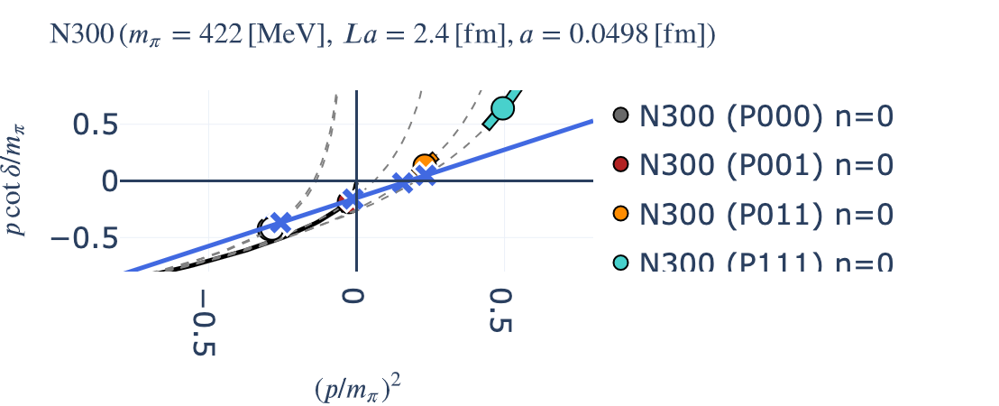

In [38]:
ere_prm = (-0.15, 1.7)
ef.check_ERE_intersection(ere_prm)

CPU times: user 18.9 s, sys: 241 ms, total: 19.1 s
Wall time: 42.7 s


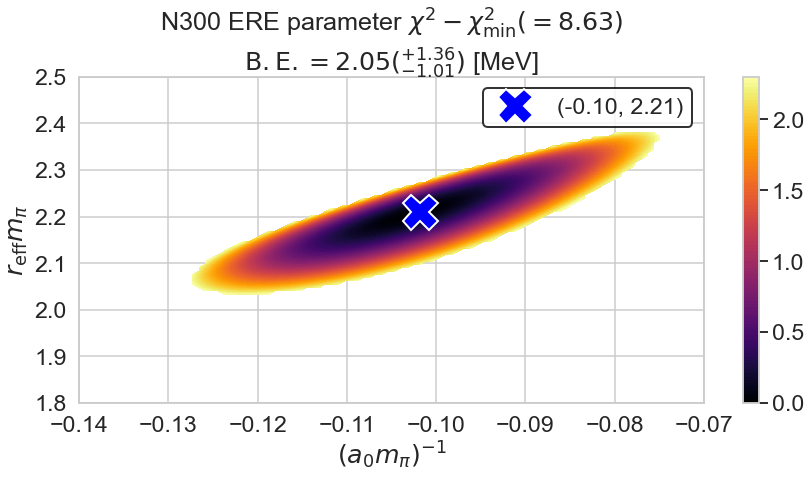

In [39]:
%%time
BE_dic[label] = ef.ERE_fit_and_plot_params((-0.14, -0.07), (1.8, 2.5), mesh_num=100)

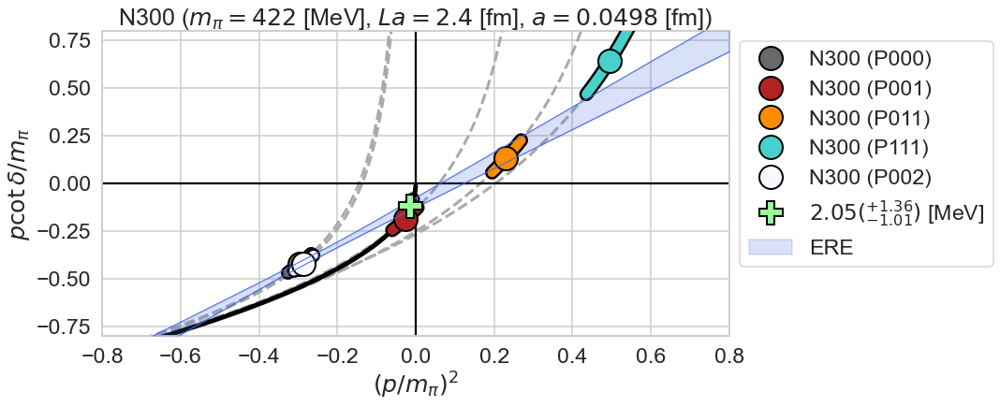

In [40]:
ef.plot_k2_vs_kcot_with_ERE(xlim, ylim)

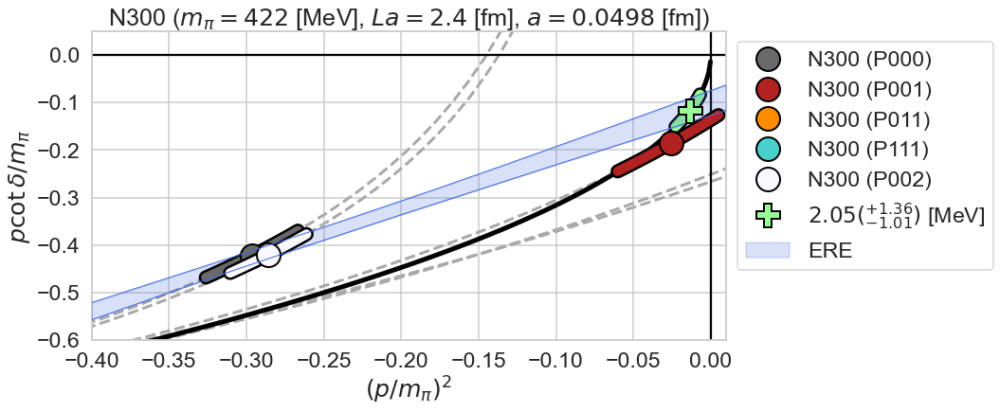

In [41]:
ef.plot_k2_vs_kcot_with_ERE((-0.4, 0.01), (-0.6, 0.05), suffix='_neg')

## H200

In [42]:
label = 'H200'
xlim = (-0.8, 1.0)
ylim = (-0.8, 1.2)
ef = ERE_fitting(label, xlim, ylim, drop_list=[('H200', 'P111', 0)])

CPU times: user 16.3 s, sys: 210 ms, total: 16.6 s
Wall time: 24.4 s


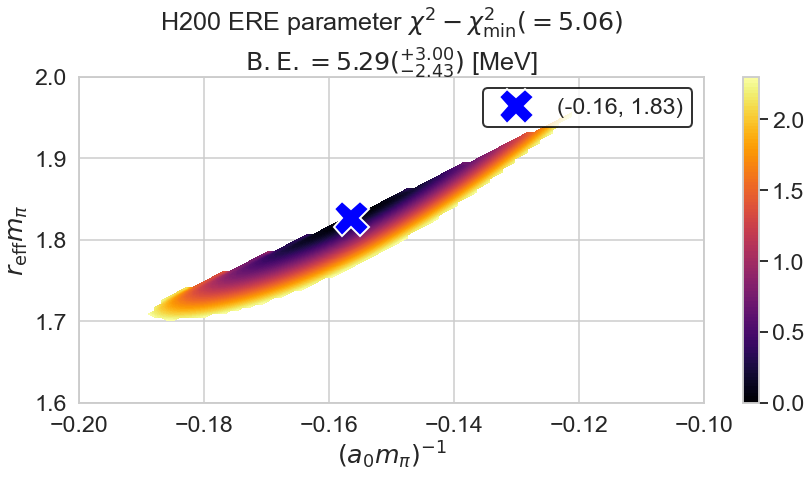

In [43]:
%%time
BE_dic[label] = ef.ERE_fit_and_plot_params((-0.2, -0.1), (1.6, 2.0), mesh_num=100)


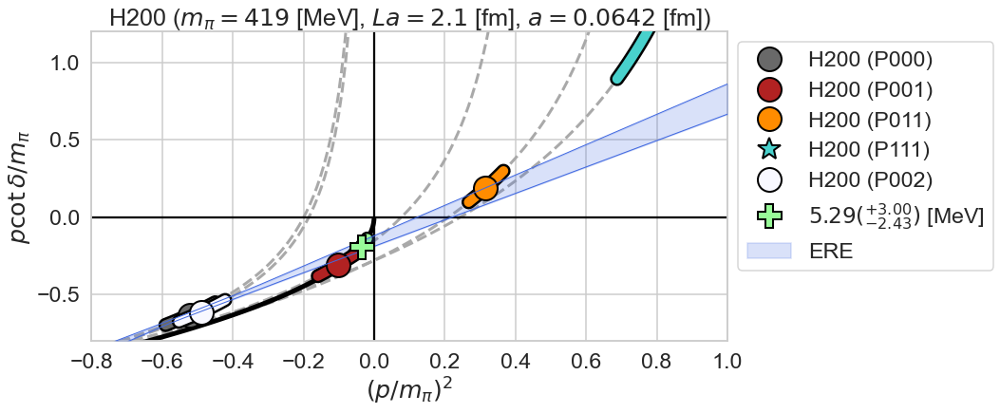

In [44]:
ef.plot_k2_vs_kcot_with_ERE(xlim, ylim)


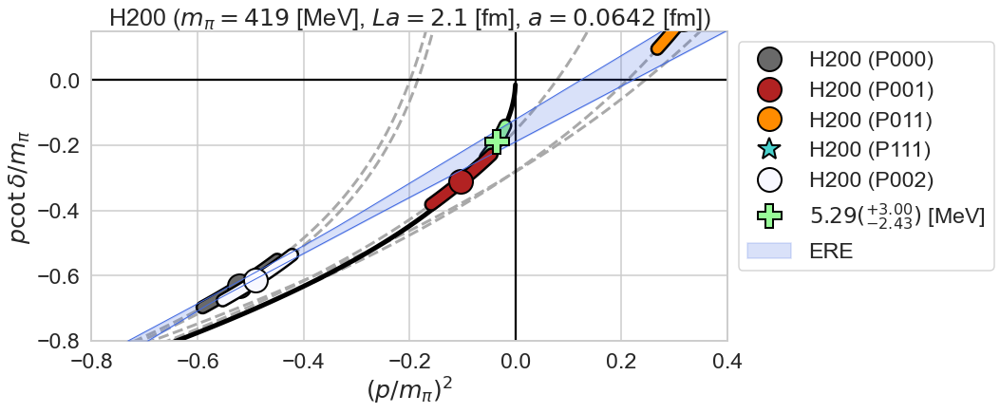

In [45]:
ef.plot_k2_vs_kcot_with_ERE((-0.8, 0.4), (-0.8, 0.15), suffix='_neg')

## N202

In [46]:
label = 'N202'
xlim = (-0.4, 0.2)
ylim = (-0.6, 0.2)
ef = ERE_fitting(label, xlim, ylim)

CPU times: user 15.7 s, sys: 144 ms, total: 15.9 s
Wall time: 26.8 s


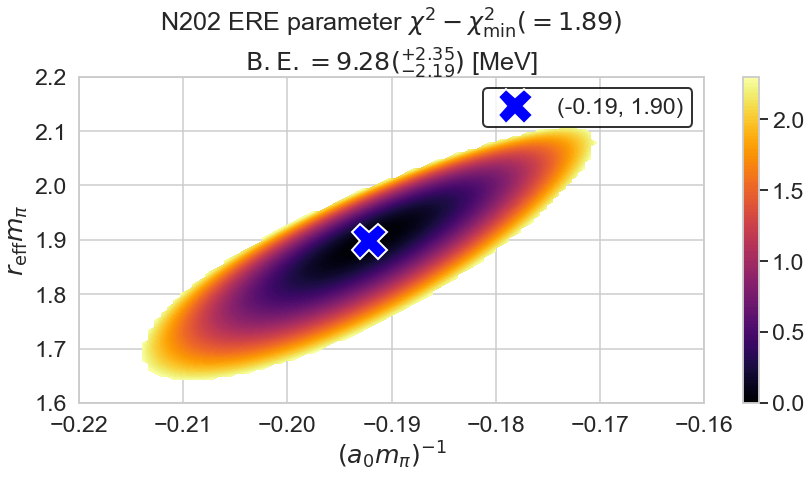

In [47]:
%%time
BE_dic[label] = ef.ERE_fit_and_plot_params((-0.22, -0.16), (1.6, 2.2), mesh_num=100)

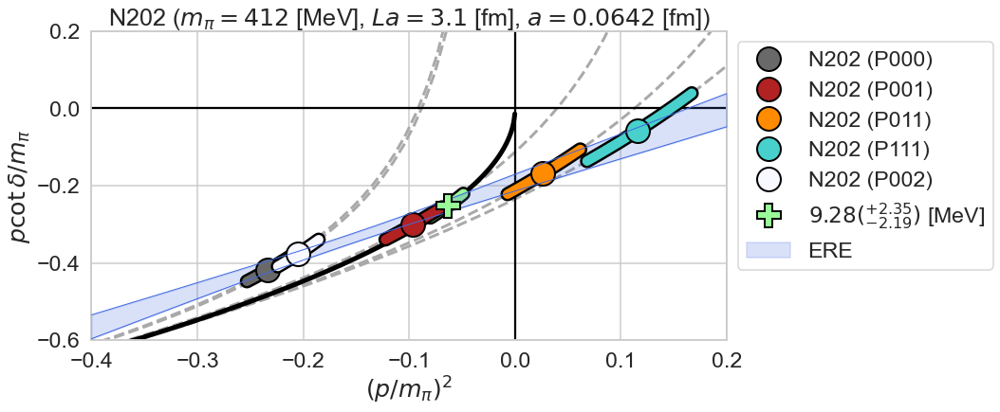

In [48]:
ef.plot_k2_vs_kcot_with_ERE(xlim, ylim)

## B450

In [49]:
label = 'B450'
xlim = (-0.5, 0.5)
ylim = (-0.8, 0.4)
ef = ERE_fitting(label, xlim, ylim, drop_list=[('B450', 'P111', 0)])


CPU times: user 13.3 s, sys: 183 ms, total: 13.5 s
Wall time: 16.5 s


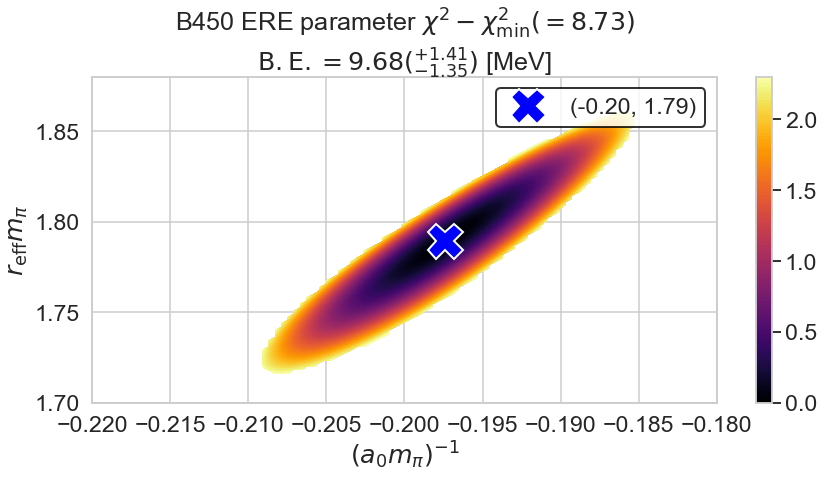

In [50]:
%%time
BE_dic[label] = ef.ERE_fit_and_plot_params((-0.22, -0.18), (1.7, 1.88), mesh_num=100)

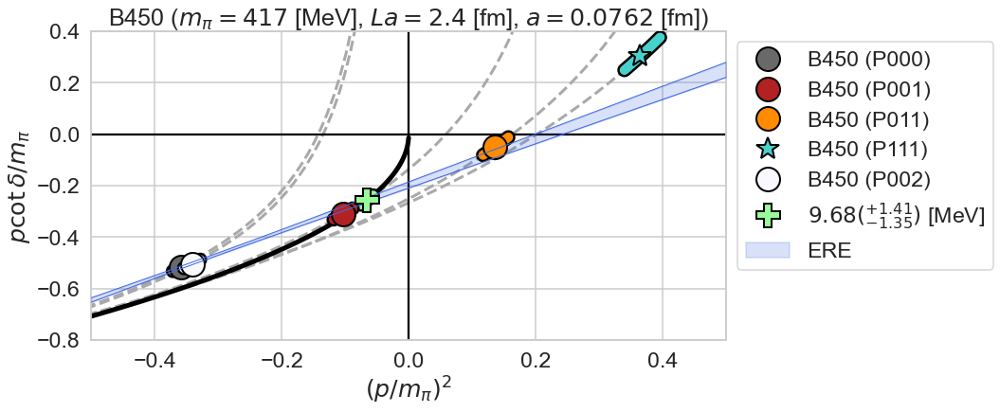

In [51]:
ef.plot_k2_vs_kcot_with_ERE(xlim, ylim)

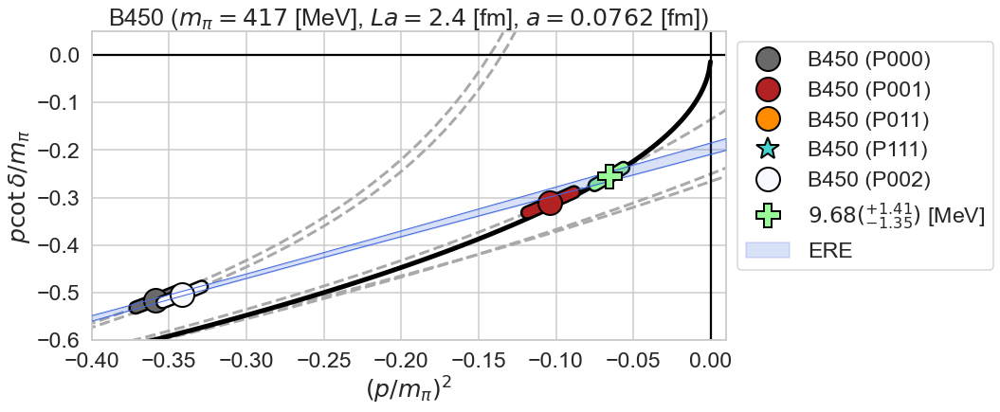

In [52]:
ef.plot_k2_vs_kcot_with_ERE((-0.4, 0.01), (-0.6, 0.05), suffix='_neg')

## U103

In [53]:
label = 'U103'
xlim = (-0.8, 0.8)
ylim = (-0.8, 0.8)
ef = ERE_fitting(label, xlim, ylim, drop_list=[('U103', 'P111', 0)])

CPU times: user 15.3 s, sys: 208 ms, total: 15.5 s
Wall time: 19.2 s


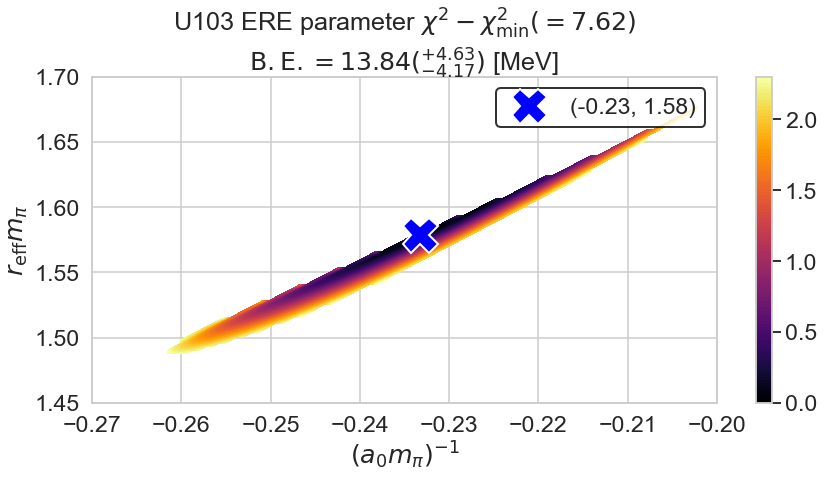

In [54]:
%%time
BE_dic[label] = ef.ERE_fit_and_plot_params((-0.27, -0.20), (1.45, 1.7), mesh_num=100)

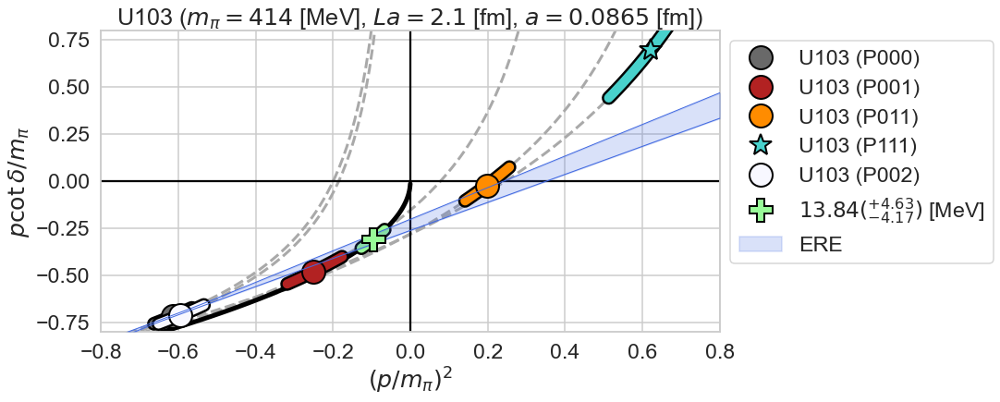

In [55]:
ef.plot_k2_vs_kcot_with_ERE(xlim, ylim)


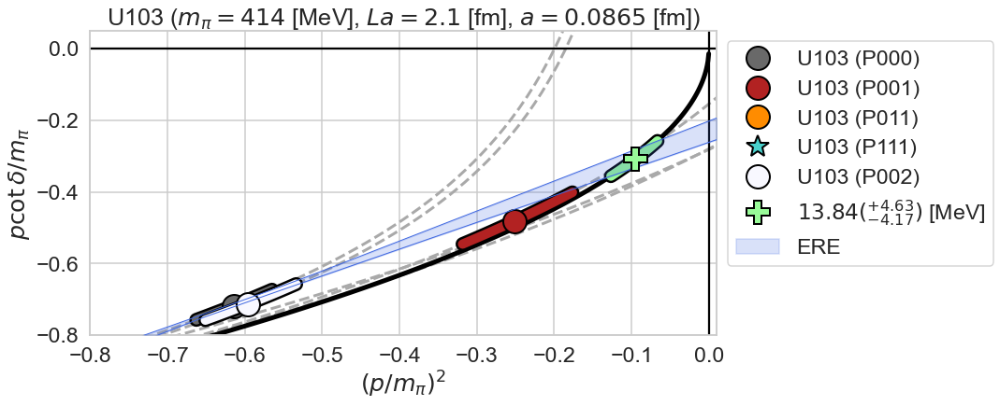

In [56]:
ef.plot_k2_vs_kcot_with_ERE((-0.8, 0.01), (-0.8, 0.05), suffix='_neg')

## H101

In [57]:
label = 'H101'
xlim = (-0.8, 0.3)
ylim = (-0.8, 0.2)
ef = ERE_fitting(label, xlim, ylim)

CPU times: user 18.7 s, sys: 206 ms, total: 18.9 s
Wall time: 26.3 s


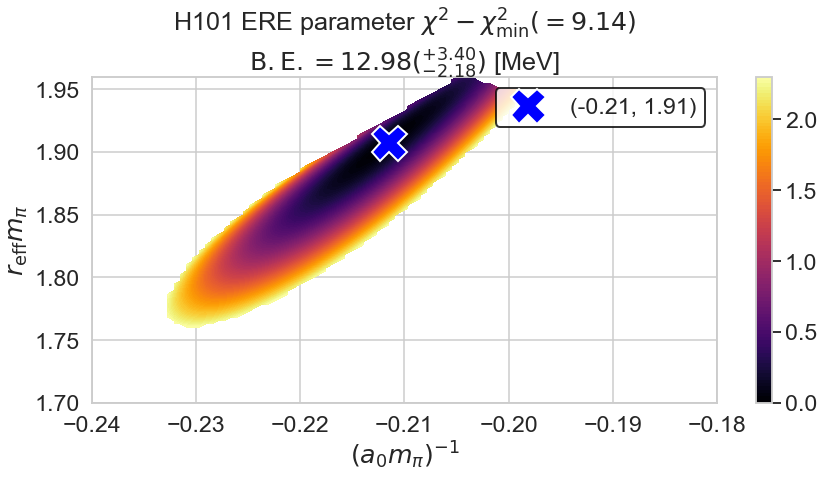

In [58]:
%%time
BE_dic[label] = ef.ERE_fit_and_plot_params((-0.24, -0.18), (1.7, 1.96), mesh_num=100)

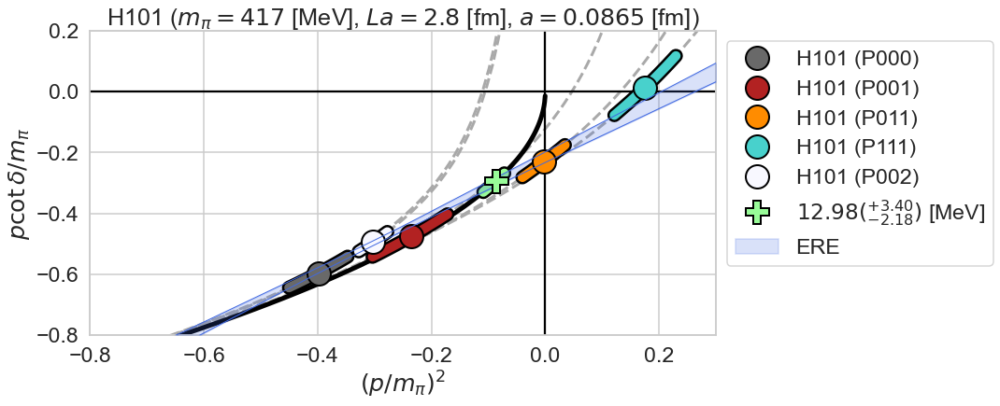

In [59]:
ef.plot_k2_vs_kcot_with_ERE(xlim, ylim)

## A653

In [60]:
label = 'A653'
xlim = (-0.8, 0.4)
ylim = (-0.8, 0.2)
ef = ERE_fitting(label, xlim, ylim)

CPU times: user 20.4 s, sys: 278 ms, total: 20.7 s
Wall time: 38.9 s


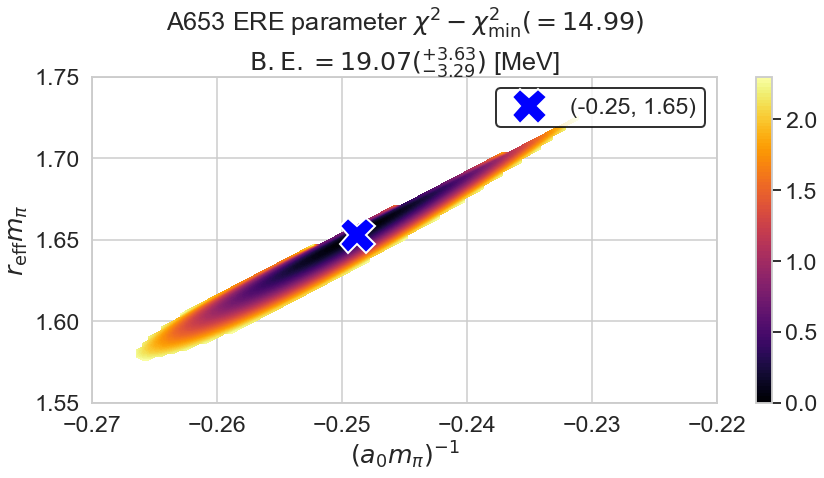

In [61]:
%%time
BE_dic[label] = ef.ERE_fit_and_plot_params((-0.27, -0.22), (1.55, 1.75), mesh_num=100)

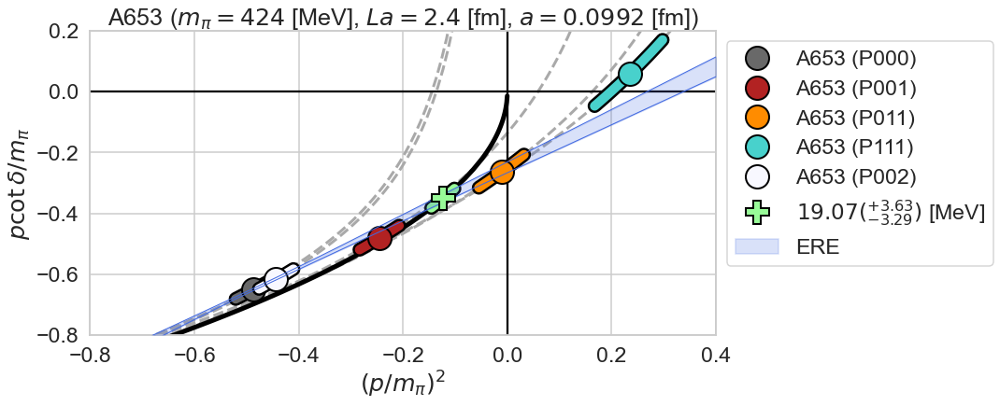

In [62]:
ef.plot_k2_vs_kcot_with_ERE(xlim, ylim)

# summary of binding energy

In [63]:
BE_dic

{'N300': (2.046858457199505, 1.0341985002564797, 3.410503953184161),
 'H200': (5.291465390003395, 2.8596364206687213, 8.287884293562456),
 'N202': (9.281278532357192, 7.088890759051992, 11.626395486617184),
 'B450': (9.677273861834692, 8.3275712772097, 11.089139319095011),
 'U103': (13.840118805386737, 9.669848074587208, 18.471786979482204),
 'H101': (12.983911456415171, 10.808342771137632, 16.385157881984014),
 'A653': (19.07262896554539, 15.784123528220334, 22.700569828807602)}

[-4.04853940e+00  2.69457384e+03 -4.26349175e+04]


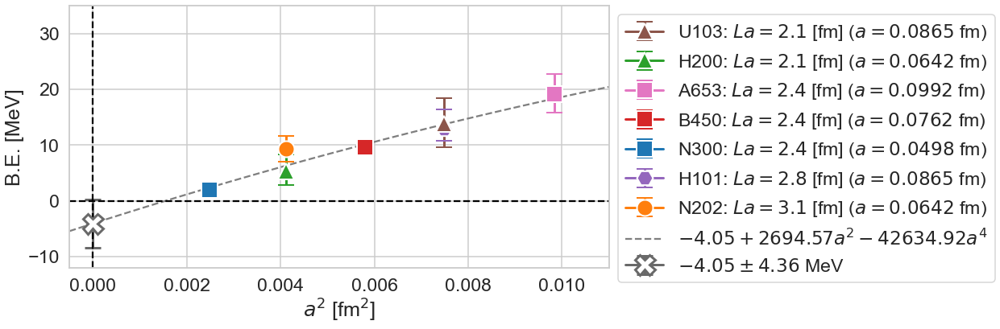

In [64]:
xs = []
ys = []
yerrs = []
with sns.color_palette('tab10'):
    fig, ax = plt.subplots(figsize=(12, 6))
    for label in label_list:
        if label in ['E5', 'E1']: continue
            
        sym = {'N202': 'o', 'H101': 'H', 'N300': 's', 'B450': 's', 'A653': 's', 'H200': '^', 'U103': '^'}[label]
        a2 = lat_unit_dic.get(label)**2
        L_fm = L_fm_dic.get(label)
        a_fm = lat_unit_dic.get(label)
        BEs = BE_dic.get(label)
        ax.errorbar([a2], [BEs[0]], yerr=[[BEs[0]-BEs[1]], [BEs[2]-BEs[0]]], marker=sym, ms=20,
                   capsize=10, lw=3, capthick=3, mec='white', mew=2, label=fr'{label}: $La = {L_fm:.1f}$ [fm] ($a = {a_fm}$ fm)')
        
        xs.append(a2)
        ys.append(BEs[0])
        yerrs.append(max([BEs[0]-BEs[1], BEs[2]-BEs[0]]))
    

    
    fit_func = lambda p, x: p[0] + p[1]*x + p[2]*x**2
    err_func = lambda p, y, x, err: (fit_func(p,x)-y)/err
    prm_fit = scipy.optimize.leastsq(err_func, [0, 1, 10], args=(np.array(ys),np.array(xs),np.array(yerrs)), full_output=True)
    
    xls = np.linspace(-0.0005, 0.012)
    print(prm_fit[0])
    p0 = prm_fit[0]
    ax.plot(xls, fit_func(prm_fit[0], xls), label=fr'${p0[0]:.2f} {p0[1]:+.2f}a^2 {p0[2]:+.2f}a^4$', ls='--')
    ax.errorbar([0], p0[0], np.sqrt(prm_fit[1][0,0]), marker='X', ms=25, mfc='white', color='dimgray', 
                capsize=10, lw=3, mew=3, capthick=3, mec='dimgray',
               label=fr'${p0[0]:.2f} \pm {np.sqrt(prm_fit[1][0,0]):.2f}$ MeV')
    
    
    hh, ll = ax.get_legend_handles_labels()
    hh = [hh[i] for i in [6, 3, 7, 4, 1, 5, 2, 0, 8]]
    ll = [ll[i] for i in [6, 3, 7, 4, 1, 5, 2, 0, 8]]
    ax.axhline(0, color='black', ls='--')
    ax.axvline(0, color='black', ls='--')
    ax.legend(hh, ll, loc='upper left', bbox_to_anchor=(1,1))
    ax.set(xlabel=r'$a^2$ [fm$^2$]', ylabel='B.E. [MeV]', xlim=(-0.0005, 0.011),  ylim=(-12, 35))
    fig.savefig('../figs/BE_summary_Nf3.png', bbox_inches='tight')
